# __Customer Segmentation using RFM Clustering Method on Brazilian E-Commerce Public Dataset by Olist__

**Data Source : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce**

**Data Creator: Olist**

**Team Members:**
1. Antonius Lemmy Wahyudi
2. Nicholas Jefferson Tansri
3. Sinabutar Yohanes Adolf Gusmories



Welcome! In this project, we will do customer segmentation on a Brazilian e-commerce public dataset of orders made at Olist Store. The dataset has information of around 100.000 orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. We also released a geolocation dataset that relates Brazilian zip codes to lat/long coordinates.

# Business Problem Understanding

>**Context**

Olist, as an end-to-end e-commerce company (handles product listing, logistics, and multiple store payment process) that was founded in 2015, is trying to increase transaction traffic on its platform (from both the sellers' and customers' side) to compete as one of the largest end-to-end e-commerce companies in Brazil such as Mercado Livre, B2W, and Via Varejo. To achieve that goal, Olist has to improve the efficiency of business expenses by doing targeted marketing approach for each customer segments.


Source : https://paganresearch.io/company/olist#:~:text=Olist%20was%20founded%20in%202015,Livre%2C%20B2W%20and%20Via%20Varejo

>**Problem Statement**

To increase transaction traffic, Olist needs to know more about the characteristics of its customers so Olist can do better business strategies for each of the customer segments. By doing so, the transaction traffic of Olist will increase and the expense will decrease due to efficiency of targeted approach. If Olist does promotion campaigns without analysing the customers' characteristics, the resources (money, time, effort, etc) spent will be wasted on the wrong customer segment.

>**Goals**

To increase transaction traffic of Olist by giving the correct and targeted promotion campaigns to the right customer according to their characteristics/segments.

>**Analytic Approach**

We are going to use a customer behavior-based marketing analysis that is called RFM (Recency, Frequency, and Monetary). This method is effective to group customers into certain segments based on their purchasing behavior.

The 'Recency' matrix focuses on the activeness of customer (can be seen from the last date of purchase made by customers). The 'Frequency' matrix focuses on the amount or frequency of purchases made by customers on Olist platform. The last matrix, 'Monetary', is used to measure the total historical purchase value. A high score in RFM matrix indicates that the customer has high value (tends to be loyal and generates a lot of revenue) for Olist.

-----------------
---------------

# Data Understanding

Data source : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=olist_products_dataset.csv

> **Data Schema**

Each raw data combination uses a specific feature as a 'connector' as below:

![Data Scheme](https://i.imgur.com/HRhd2Y0.png)

<br>
<br>

> **Table Information**
df_1 = olist_order_reviews_dataset.csv

df_2 = olist_order_payments_dataset.csv

df_3 = olist_orders_dataset.csv

df_4 = olist_customers_dataset.csv

df_5 = olist_products_dataset.csv

df_6 = olist_order_items_dataset.csv

df_7 = olist_sellers_dataset.csv

df_8 = olist_geolocation_dataset.csv

df_9 = product_category_name_translation.csv

<br> 
<br> 

> **Attribute Information** 



df_1 (each row in this dataframe represents a review made by a customer based on order_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| review_id  | Object | Unique review identifier |
| order_id | Object | Unique order identifier |
| review_score | Int | Note ranging from 1 to 5 given by the customer on a satisfaction survey |
| review_comment_title | Object | Comment title from the review left by the customer, in Portuguese| 
| review_comment_message | Object | Comment message from the review left by the customer, in Portuguese|
| review_creation_date | Object | Shows the date in which the satisfaction survey was sent to the customer|
| review_answer_timestamp | Object | Shows satisfaction survey answer timestamp|


df_2 (each row in this dataframe represents payment information made by customers based on order_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| order_id | Object | Unique identifier of an order|
| payment_sequential | Int | A customer may pay an order with more than one payment method. If he does so, a sequence will be created. (every voucher will be considered as a different payment sequence) |
| payment_type | Object | Method of payment chosen by the customer |
| payment_installments | Int | Number of installments chosen by the customers if they use credit card as payment method | 
| payment_value | Object | Transaction value (in Brazilian Real) |


df_3 (each row in this dataframe represents order process information based on order_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| order_id | Object | Unique identifier of an order|
| customer_id | Object | Key to the orders dataset. Each order has a unique customer_id|
| order_status | Object | Reference to the order status (delivered, shipped, etc) |
| order_purchase_timestamp | Object | Shows the purchase timestamp |
| order_approved_at | Object | Shows the payment approval timestamp |
| order_delivered_carrier_date | Object | Shows the order posting timestamp. When it was handled to the logistic partner |
| order_delivered_customer_date | Object | Shows the actual order delivery date to the customer |
| order_estimated_delivery_date | Object | Shows the estimated delivery date that was informed to customer at the purchase moment |

df_4 (each row in this dataframe represents customer geolocation based on customer_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| customer_id | Object | Key to the orders dataset. Each order has a unique customer_id|
| customer_unique_id | Object | Unique identifier of a customer |
| customer_zip_code_prefix | Int | First five digits of customer zip code |
| customer_city | Object | Customer city name (city name with standardized writing format without duplicated value)|
| customer_state | Object | Customer state |


df_5 (each row in this dataframe represents product information based on product_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| product_id | Object | Unique product identifier|
| product_category_name | Object | Root category of product, in Portuguese|
| product_name_lenght | Float | Number of characters extracted from the product name |
| product_description_lenght | Float | Number of characters extracted from the product description |
| product_photos_qty | Float | Number of product published photos |
| product_weight_g | Float | Product weight measured in grams |
| product_length_cm | Float | Product length measured in centimeters |
| product_height_cm | Float | Product height measured in centimeters |
| product_width_cm | Float | Product width measured in centimeters |


df_6 (each row in this dataframe represents order information based on order_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| order_id | Object | Order unique identifier|
| order_item_id | Int | Sequential number identifying number of items included in the same order|
| product_id | Object | Product unique identifier |
| seller_id | Object | Seller unique identifier |
| shipping_limit_date | Object | Shows the seller shipping limit date for handling the order over to the logistic partner |
| price | Float | Item price (in Brazilian Real) |
| freight_value | Float | Item freight value item (if an order has more than one item the freight value is splitted between items. In Brazilian Real) |

df_7 (each row in this dataframe represents seller geolocation bsed on seller_id)
| Attribute | Data Type | Description |
| --- | --- | --- |
| seller_id | Object | Seller unique identifier|
| seller_zip_code_prefix | Int| first 5 digits of seller zip code |
| seller_city | Object | Seller city name (have several duplicated values due to different writing format and typographical error) |
| seller_state | Object | Seller state |

df_8 (each row in this dataframe represents location information along with its lat/long coordinates based on zip_code)
| Attribute | Data Type | Description |
| --- | --- | --- |
| geolocation_zip_code_prefix | Int | First 5 digits of zip code|
| geolocation_lat | Float| Latitude |
| geolocation_lng | Float | Longitude |
| geolocation_city | Object | City name (have several duplicated values due to different writing format and typographical error) |
| geolocation_state | Object | State name |

df_9 (each row in this dataframe represents translation for product category name from Portuguese to English)
| Attribute | Data Type | Description |
| --- | --- | --- |
| product_category_name | Object | Category name in Portuguese|
| product_category_name_english | Object | Category name in English|

> ## **Import Library**

In [200]:
# Data Manipulation
import pandas as pd
import numpy as np
import datetime
import random

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

# Modeling
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

# pd.set_option('display.max_columns', None)

> ## **Load Dataset**

In [201]:
df_1 = pd.read_csv('olist_order_reviews_dataset.csv')
df_2 = pd.read_csv('olist_order_payments_dataset.csv')
df_3 = pd.read_csv('olist_orders_dataset.csv')
df_4 = pd.read_csv('olist_customers_dataset.csv')
df_5 = pd.read_csv('olist_products_dataset.csv')
df_6 = pd.read_csv('olist_order_items_dataset.csv')
df_7 = pd.read_csv('olist_sellers_dataset.csv')
df_8 = pd.read_csv('olist_geolocation_dataset.csv')
df_9 = pd.read_csv('product_category_name_translation.csv')

# Create a list that contains all of the dataframe above
list_df = [df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9]

In [202]:
# Transform data type of df_1['review_creation_date'] from object to datetime
df_1['review_creation_date'] = pd.to_datetime(df_1['review_creation_date'])
df_1['review_answer_timestamp'] = pd.to_datetime(df_1['review_answer_timestamp'])

df_3['order_purchase_timestamp'] = pd.to_datetime(df_3['order_purchase_timestamp'])
df_3['order_approved_at'] = pd.to_datetime(df_3['order_approved_at'])
df_3['order_delivered_carrier_date'] = pd.to_datetime(df_3['order_delivered_carrier_date'])
df_3['order_delivered_customer_date'] = pd.to_datetime(df_3['order_delivered_customer_date'])
df_3['order_estimated_delivery_date'] = pd.to_datetime(df_3['order_estimated_delivery_date'])

df_6['shipping_limit_date'] = pd.to_datetime(df_6['shipping_limit_date'])

In [203]:
# Using enumerate() and for loop to show the content of these dataframes
for index,value in enumerate(list_df):
    print(f'df_{index+ 1}')
    display(value)

df_1


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01,2018-07-02 12:59:13


df_2


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


df_3


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


df_4


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


df_5


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


df_6


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


df_7


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


df_8


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


df_9


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


> ## Features for Machine Learning

> ### Recency

| Dataframe | Columns/Features |
| --- | --- | 
| df_1 | review_creattion_date |
| df_1 | review_answer_timestamp |
| df_3 | order_id | 
| df_3 | order_purchase_timestamp | 
| df_4 | customer_unique_id | 

<br>
<br>

> ### Frequency

| Dataframe | Columns/Features |
| --- | --- | 
| df_3 | order_id |
| df_4 | customer_unique_id |
 
<br>
<br>

> ### Monetary

| Dataframe | Columns/Features |
| --- | --- | 
| df_4 | customer_unique_id |
| df_6 | order_id |
| df_6 | order_item_id |
| df_6 | product_id |
| df_6 | price |
| df_6 | freight_value |


> ## Data Cleaning

### **Duplicated Data**

In [204]:
# Checking any duplicated data in all dataframes
duplicated_sum = pd.DataFrame({'df':[], 'duplicated_sum':[]})
for df in list_df:
    df_name = [name for name in globals() if globals()[name] is df][0]
    duplicated = df.duplicated().sum()

    new_row = pd.Series({'df':df_name, 'duplicated_sum':duplicated})
    
    duplicated_sum = duplicated_sum.append(new_row, ignore_index=True)

duplicated_sum

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3525171678.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicated_sum = duplicated_sum.append(new_row, ignore_index=True)
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3525171678.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicated_sum = duplicated_sum.append(new_row, ignore_index=True)
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3525171678.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicated_sum = duplicated_sum.append(new_row, ignore_index=True)
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3525171678.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instea

,df,duplicated_sum
0,df_1,0.0
1,df_2,0.0
2,df_3,0.0
3,df_4,0.0
4,df_5,0.0
5,df_6,0.0
6,df_7,0.0
7,df_8,261831.0
8,df_9,0.0


It is clear that there are 261831 duplicated data in df_8. These data will be dropped since it will worsen our model performance.

In [205]:
# Drop duplicated data
df_8.drop_duplicates(inplace=True)

#### df_2

In [206]:
# Checking payment_type 'not defined' and payment_value that has 0 value (both are considered as invalid data)
df_2[(df_2['payment_type']=='not_defined')|(df_2['payment_value']==0)]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.0
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.0
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.0
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.0
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0
100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.0


In [207]:
# Checking payment_type 'not defined' and payment_value that has 0 value (both are considered as invalid data)
df_2[(df_2['payment_type']=='not_defined')|(df_2['payment_value']==0)]
df_2.shape

(103886, 5)

We have dropped all data that has payment_value of 0 and payment_type of 'not_defined' because payment_value is the primary data for RFM (to be precise, for 'Monetary' matrix).

#### df_3

In [208]:
# We also found several abnormal data where the order_delivered_carrier_date is later than order_delivered_customer_date
# But we are still going to use these data since we assumed that this is due human error, since all of these shipments have 'delivered' as the status
display(df_3[(df_3['order_delivered_carrier_date']>df_3['order_delivered_customer_date'])],
df_3[(df_3['order_delivered_carrier_date']>df_3['order_delivered_customer_date'])]['order_status'].unique())

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6437,a1abeb653a4d4cd1e142ccb8c82cd069,5f50465da00b7fed5dd1239f4ecf6e2c,delivered,2017-07-20 11:20:52,2017-07-21 06:43:14,2017-07-28 16:57:58,2017-07-25 19:32:56,2017-08-14
9553,383aa8b2724fe452d9ccd9934a8c628b,b1cb2f9d7a19480f3749e248db14d58f,delivered,2017-07-02 20:58:43,2017-07-02 21:10:20,2017-07-07 17:22:41,2017-07-06 14:27:51,2017-07-21
13487,cb1134f9010d242e9515ad1c78ec0c39,2fd33ac77677bd214b1882868317eeed,delivered,2017-07-16 12:35:34,2017-07-18 06:03:50,2017-07-20 19:22:02,2017-07-19 14:13:28,2017-08-08
14474,dceb62e8fa94b46006c9554fed743df0,2721900eb4e0f1cc2c836dd7bc1b1e11,delivered,2017-07-20 20:58:05,2017-07-22 11:45:11,2017-08-01 18:23:30,2017-07-26 18:09:10,2017-08-11
19268,5f9d46795c3126674e52becb3a1a517f,79287bcaafdde5c793b996fc40bb7d9f,delivered,2017-07-18 11:48:20,2017-07-18 12:03:29,2017-07-20 23:03:42,2017-07-20 18:52:41,2017-07-31
21338,8c78d01de3a9009e23d6877a7cc9be20,6cd7106899e59a1fbd0622d5f1efedf4,delivered,2016-10-08 15:36:50,2016-10-08 18:13:44,2016-10-26 11:41:53,2016-10-25 17:51:46,2016-11-30
22520,b27af682321527a6349f1761eb3f360c,9859dd92e872dbaa60ca3cd5f0d7ad07,delivered,2017-06-14 20:17:04,2017-06-14 20:30:08,2017-06-27 14:51:54,2017-06-26 15:45:35,2017-07-14
25393,1cc3ae63caffff2d6c3ee3e78e074acf,01c843a2c0600def0b7693dba47af460,delivered,2017-08-07 21:35:22,2017-08-08 21:45:15,2017-08-10 18:28:56,2017-08-10 18:05:38,2017-08-25
25646,e37f11cae9985ca58f0b56f268720537,3947a361301f2ff0f3223159a0f2701c,delivered,2017-07-26 11:46:34,2017-07-27 10:10:16,2017-08-01 18:17:47,2017-07-31 17:49:56,2017-08-24
27470,fa3e37584f4fdb1ded0e0de700dfcb4e,63be4feff10a0b1d85f2cfbf10df9754,delivered,2017-07-30 19:32:23,2017-07-30 19:45:09,2017-08-09 18:18:43,2017-08-01 21:13:01,2017-08-18


array(['delivered'], dtype=object)

Abnormal data due to order_delivered_carrier_date > order_delivered_customer_date will be used because these data are not a primary data for RFM and only be used for EDA purposes.

#### df_5

In [209]:
# Checking products without weight (product_weight_g = 0 gram)
df_5[df_5['product_weight_g']==0]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
9769,81781c0fed9fe1ad6e8c81fca1e1cb08,cama_mesa_banho,51.0,529.0,1.0,0.0,30.0,25.0,30.0
13683,8038040ee2a71048d4bdbbdc985b69ab,cama_mesa_banho,48.0,528.0,1.0,0.0,30.0,25.0,30.0
14997,36ba42dd187055e1fbe943b2d11430ca,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
32079,e673e90efa65a5409ff4196c038bb5af,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0


In [210]:
# Checking products without weight using freight value
# These data will still be used because we assumed that all products that have 0 weight are caused by human error (misinput), due to the fact that the freight_value is not 0
# Also, the product_weight_g will not be used for RFM, so we can keep these data
df_6.merge(df_5[df_5['product_weight_g']==0],how='inner',on='product_id')

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,06afc1144eb9f51ef2aa90ec9223c7f4,1,e673e90efa65a5409ff4196c038bb5af,b39d7fe263ef469605dbb32608aee0af,2018-08-23 17:25:20,129.9,23.71,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
1,06afc1144eb9f51ef2aa90ec9223c7f4,2,e673e90efa65a5409ff4196c038bb5af,b39d7fe263ef469605dbb32608aee0af,2018-08-23 17:25:20,129.9,23.71,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
2,476b812a7e4fc972646eb390517bddcb,1,e673e90efa65a5409ff4196c038bb5af,b39d7fe263ef469605dbb32608aee0af,2018-08-22 11:30:42,129.9,23.71,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
3,b489f7ae130ba3fd26b0a20f8cc81c61,1,e673e90efa65a5409ff4196c038bb5af,b39d7fe263ef469605dbb32608aee0af,2018-08-22 20:49:57,129.9,23.71,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
4,06d9e69034388abf6da64378e10737b8,1,36ba42dd187055e1fbe943b2d11430ca,b39d7fe263ef469605dbb32608aee0af,2018-08-10 09:10:11,100.0,23.85,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
5,06d9e69034388abf6da64378e10737b8,2,36ba42dd187055e1fbe943b2d11430ca,b39d7fe263ef469605dbb32608aee0af,2018-08-10 09:10:11,100.0,23.85,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
6,200b121c28e10ef638131a7c76753327,1,81781c0fed9fe1ad6e8c81fca1e1cb08,b39d7fe263ef469605dbb32608aee0af,2018-08-14 16:10:16,100.0,19.89,cama_mesa_banho,51.0,529.0,1.0,0.0,30.0,25.0,30.0
7,4abc7b5330425bcf9c2f7f48151a88c0,1,8038040ee2a71048d4bdbbdc985b69ab,b39d7fe263ef469605dbb32608aee0af,2018-08-09 21:31:33,129.9,14.49,cama_mesa_banho,48.0,528.0,1.0,0.0,30.0,25.0,30.0


In [211]:
# Checking data with missing product_category_name (NaN value)
df_5[df_5['product_category_name'].isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [212]:
# Due to the fact that the amount of price for 'NaN' category is pretty high, we cannot drop these data and we will fill the missing values with a new category called 'unknown
display(df_6.merge(df_5[df_5['product_category_name'].isna()],how='inner',on='product_id'),'Total amount of price with missing product category:',
        df_6.merge(df_5[df_5['product_category_name'].isna()],how='inner',on='product_id')['price'].sum())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,0046e1d57f4c07c8c92ab26be8c3dfc0,1,ff6caf9340512b8bf6d2a2a6df032cfa,38e6dada03429a47197d5d584d793b41,2017-10-02 15:49:17,7.79,7.78,NaN,NaN,NaN,NaN,200.0,16.0,5.0,12.0
1,0ca8999f0176e37f35b6e49a9b2569da,1,ff6caf9340512b8bf6d2a2a6df032cfa,38e6dada03429a47197d5d584d793b41,2017-10-13 10:49:27,7.79,8.85,NaN,NaN,NaN,NaN,200.0,16.0,5.0,12.0
2,0ca8999f0176e37f35b6e49a9b2569da,5,ff6caf9340512b8bf6d2a2a6df032cfa,38e6dada03429a47197d5d584d793b41,2017-10-13 10:49:27,7.79,8.85,NaN,NaN,NaN,NaN,200.0,16.0,5.0,12.0
3,00482f2670787292280e0a8153d82467,1,a9c404971d1a5b1cbc2e4070e02731fd,702835e4b785b67a084280efca355756,2017-02-17 16:18:07,7.60,10.96,NaN,NaN,NaN,NaN,700.0,35.0,14.0,11.0
4,004f5d8f238e8908e6864b874eda3391,1,5a848e4ab52fd5445cdc07aab1c40e48,c826c40d7b19f62a09e2d7c5e7295ee2,2018-03-06 09:29:25,122.99,15.61,NaN,NaN,NaN,NaN,400.0,20.0,12.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1598,fe421e7d38d622aedc8ca97d58771ea6,1,28209b7aed95f7c0c9b9806f974a104e,432c37c9dfba871172ec162e20118b8c,2017-04-27 08:55:13,119.90,18.27,NaN,NaN,NaN,NaN,500.0,30.0,4.0,15.0
1599,fe7387b4827383e4868b82be1dd12722,1,41bf6a8c9424d4ec060e39e21883db3f,226b05fe067266c59c15dae208213d06,2018-04-08 22:55:29,29.90,17.06,NaN,NaN,NaN,NaN,150.0,22.0,14.0,14.0
1600,fe97f3949cbc37b9ab48ac5769514cbe,1,40a1e3c65a0bcf6f4ebba840a8156ba2,f3295428338a40977a03f555246a70f4,2017-12-05 13:39:28,29.90,15.10,NaN,NaN,NaN,NaN,200.0,16.0,10.0,13.0
1601,fea563d194760a0737be8bff36ca8c40,1,34a4076cd057a823247a5a44e84872d8,520b493b57809f446cb0a233bb3e25c7,2017-06-15 18:35:09,59.90,17.67,NaN,NaN,NaN,NaN,1900.0,40.0,40.0,30.0


'Total amount of price with missing product category:'

179535.28

In [213]:
# Filling the missing value with 'unknown'
df_5['product_category_name'] = df_5['product_category_name'].fillna('unknown')
df_5['product_category_name'].isna().sum()

0

Abnormal data (product without weight and description such as product_name_length, product_description_length, etc) will be used because these data are not a primary data for RFM and only be used for EDA.

In [214]:
# Correcting writing format of product_name_length and product_description length
df_5 = df_5.rename(columns={'product_name_lenght':'product_name_length', 'product_description_lenght':'product_description_length'})
df_5

,product_id,product_category_name,product_name_length,product_description_length,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


#### df_6

In [215]:
# Checking product without freight value
df_6[df_6['freight_value']==0]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
114,00404fa7a687c8c44ca69d42695aae73,1,53b36df67ebb7c41585e8d54d6772e08,7d13fca15225358621be4086e1eb0964,2018-05-15 04:31:26,99.9,0.0
258,00a870c6c06346e85335524935c600c0,1,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,2018-05-14 00:14:29,69.9,0.0
483,011c899816ea29773525bd3322dbb6aa,1,53b36df67ebb7c41585e8d54d6772e08,7d13fca15225358621be4086e1eb0964,2018-05-07 05:30:45,99.9,0.0
508,012b3f6ab7776a8ab3443a4ad7bef2e6,1,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,2018-05-09 21:30:50,53.9,0.0
509,012b3f6ab7776a8ab3443a4ad7bef2e6,2,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,2018-05-09 21:30:50,53.9,0.0
...,...,...,...,...,...,...,...
111094,fc698f330ec7fb74859071cc6cb29772,1,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,2018-04-25 02:31:57,53.9,0.0
111497,fd4907109f6bac23f07064af84bec02d,1,7a10781637204d8d10485c71a6108a2e,4869f7a5dfa277a7dca6462dcf3b52b2,2018-04-30 11:31:32,219.0,0.0
111649,fd95e4b85ebbb81853d4a6be3d61432b,1,53b36df67ebb7c41585e8d54d6772e08,4869f7a5dfa277a7dca6462dcf3b52b2,2018-05-04 11:10:31,106.9,0.0
112182,fee19a0dc7358b6962a611cecf6a37b4,1,f1c7f353075ce59d8a6f3cf58f419c9c,37be5a7c751166fbc5f8ccba4119e043,2017-09-07 22:06:31,195.0,0.0


In [216]:
# Since all data with 0 freight_value have dimension (length, height, and width) and weight, we can assume that the freight_value of 0 is caused by either:
# 1. Close delivery distance, or
# 2. Free delivery promotion/self pickup
df_5.merge(df_6[df_6['freight_value']==0],how='inner',on='product_id')

,product_id,product_category_name,product_name_length,product_description_length,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
0,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,00404fa7a687c8c44ca69d42695aae73,1,7d13fca15225358621be4086e1eb0964,2018-05-15 04:31:26,99.90,0.0
1,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,011c899816ea29773525bd3322dbb6aa,1,7d13fca15225358621be4086e1eb0964,2018-05-07 05:30:45,99.90,0.0
2,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,0517a3e68dac3308995edca2144db36e,1,7d13fca15225358621be4086e1eb0964,2018-05-03 19:11:40,99.90,0.0
3,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,061ba2e2d7544790b6ed6b5b4dd9278c,1,7d13fca15225358621be4086e1eb0964,2018-05-09 23:10:46,110.00,0.0
4,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,07441f525824bc6b31d4dc19c5d49fc9,1,4869f7a5dfa277a7dca6462dcf3b52b2,2018-04-26 13:31:30,106.90,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,f1c7f353075ce59d8a6f3cf58f419c9c,cama_mesa_banho,56.0,162.0,5.0,9750.0,35.0,12.0,30.0,ca860fbc7c3132b89e9e134a00652215,1,37be5a7c751166fbc5f8ccba4119e043,2017-09-06 04:25:55,195.00,0.0
379,f1c7f353075ce59d8a6f3cf58f419c9c,cama_mesa_banho,56.0,162.0,5.0,9750.0,35.0,12.0,30.0,e37b307b6954ca1be0ac80b25209bf9b,1,37be5a7c751166fbc5f8ccba4119e043,2017-09-06 14:35:31,195.00,0.0
380,f1c7f353075ce59d8a6f3cf58f419c9c,cama_mesa_banho,56.0,162.0,5.0,9750.0,35.0,12.0,30.0,fee19a0dc7358b6962a611cecf6a37b4,1,37be5a7c751166fbc5f8ccba4119e043,2017-09-07 22:06:31,195.00,0.0
381,5a848e4ab52fd5445cdc07aab1c40e48,unknown,NaN,NaN,NaN,400.0,20.0,12.0,15.0,c9501c00fae501ebb1ac842b94bbf192,1,c826c40d7b19f62a09e2d7c5e7295ee2,2018-05-03 03:51:39,122.99,0.0


Abnormal data (product without freight_value) will be used because these data are not a primary data for RFM and only be used for EDA.

#### df_1

In [217]:
df_1

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01,2018-07-02 12:59:13


In [218]:
# Checking if there is any order_id with more than 1 review_id
df_1.groupby('order_id').count()[df_1.groupby('order_id').count()['review_id'] > 1].sort_values('review_id', ascending=False)['review_id'].reset_index()

,order_id,review_id
0,df56136b8031ecd28e200bb18e6ddb2e,3
1,c88b1d1b157a9999ce368f218a407141,3
2,8e17072ec97ce29f0e1f111e598b0c85,3
3,03c939fd7fd3b38f8485a0f95798f1f6,3
4,a5507507d82c1fb664405882ed065af0,2
...,...,...
542,468edfd1aeeeef023e6bba4943f2cdfb,2
543,45390ff93f092f0de1524d486a172c33,2
544,450c49623c365a4edcf0c5a2c93aa7c9,2
545,44cb884118c81bf6db2f43cf11ab63d6,2


In [219]:
# Display order_id that have more than 1 review_id
order_reviews = df_1.groupby('order_id').count()[df_1.groupby('order_id').count()['review_id'] > 1].sort_values('review_id', ascending=False)['review_id'].reset_index()['order_id'].to_list()
display(order_reviews)

print(f'Total: {len(order_reviews)}')

['df56136b8031ecd28e200bb18e6ddb2e',
 'c88b1d1b157a9999ce368f218a407141',
 '8e17072ec97ce29f0e1f111e598b0c85',
 '03c939fd7fd3b38f8485a0f95798f1f6',
 'a5507507d82c1fb664405882ed065af0',
 'a17af8e6044c5ccaa87b1d97559dc554',
 'a1b8aea9fd9e26a8644a65e1aaea8740',
 'a1d50a1883814a31c8629adf354c1013',
 'a47bf2de96db0109440cc21208edcc4f',
 'a4b276bd4a9eba543ec90cdf29a67308',
 '0035246a40f520710769010f752e7507',
 'a56e54593f2c7f2b10f69216a7265aa5',
 '9eb9610a7e3c04e7ab0298d704c383dc',
 'a5a322511ad2f5a5296e865cd5c23abe',
 'a67f04f0a3022835f86664a0070fe36e',
 'a7dbcf5043158d6fa72859eead2f3d10',
 'a89773db642a632c5cf8534ce1a49b28',
 'a92733241b636a8ffddd05c56714d32d',
 'a07c319b821b5707ba0b018c7ad63aef',
 '9e8bf3ebc81cc29ee6e934d95370e5bc',
 'aa20064eef8808d62ed9ac5286ec0796',
 '9e47bdda0d32604c18e587c151278314',
 '9de38c42ea4d33af19aac6c4d6c4b146',
 '9de125e032c8c74ccbcf9a5b7a3b4faa',
 '9db5ceb6f107ae0944c19188c8869a03',
 '9d6e7e70e068602fa740fc3163cefd3b',
 '9cffda8a5be9e20be381cc47ef5e8e00',
 

Total: 547


There are 547 order_id that have more than 1 review_id. We will check back these order_id with the reviewed products.

In [220]:
df_1.merge(df_6, on='order_id', how='left')[df_1.merge(df_6, on='order_id', how='left')['order_id'].isin(random.sample(order_reviews,1))]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
53537,bea027d5b8f46e93c2fc10e554bffa84,2477bfb97977363803e3cdd7c6805198,4,NaN,NaN,2017-12-19,2017-12-19 21:44:16,1.0,7c1bd920dbdf22470b68bde975dd3ccf,cc419e0650a3c5ba77189a1882b7556a,2017-12-05 23:31:20,58.99,17.66
91432,ec631e163f9b436499fd8fcda6ea3b03,2477bfb97977363803e3cdd7c6805198,5,NaN,NaN,2017-12-20,2017-12-21 02:47:14,1.0,7c1bd920dbdf22470b68bde975dd3ccf,cc419e0650a3c5ba77189a1882b7556a,2017-12-05 23:31:20,58.99,17.66


From the above table, we can see that in a same order_id and product_id, there are more that 1 review_id. Since there are no further explanation regarding this dataset, we can assume that all customers at Olist can change their review. In this case, we will take the latest review created by the customers (from the latest review_creation_date).

In [221]:
# Sorting order_id from the latest review_creation_date
df_1 = df_1.sort_values('review_creation_date', ascending=False).groupby('order_id').first().reset_index()
df_1

,order_id,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,00010242fe8c5a6d1ba2dd792cb16214,97ca439bc427b48bc1cd7177abe71365,5,None,"Perfeito, produto entregue antes do combinado.",2017-09-21,2017-09-22 10:57:03
1,00018f77f2f0320c557190d7a144bdd3,7b07bacd811c4117b742569b04ce3580,4,None,None,2017-05-13,2017-05-15 11:34:13
2,000229ec398224ef6ca0657da4fc703e,0c5b33dea94867d1ac402749e5438e8b,5,None,Chegou antes do prazo previsto e o produto sur...,2018-01-23,2018-01-23 16:06:31
3,00024acbcdf0a6daa1e931b038114c75,f4028d019cb58564807486a6aaf33817,4,None,None,2018-08-15,2018-08-15 16:39:01
4,00042b26cf59d7ce69dfabb4e55b4fd9,940144190dcba6351888cafa43f3a3a5,5,None,Gostei pois veio no prazo determinado .,2017-03-02,2017-03-03 10:54:59
...,...,...,...,...,...,...,...
98668,fffc94f6ce00a00581880bf54a75a037,9185f849f32d82e216a4e025e0c50f5c,5,None,None,2018-05-11,2018-05-14 12:53:47
98669,fffcd46ef2263f404302a634eb57f7eb,be803f6a93d64719fd685c1cc610918a,5,None,None,2018-07-24,2018-07-25 09:25:29
98670,fffce4705a9662cd70adb13d4a31832d,dbdd81cd59a1a9f94a10a990b4d48dce,5,None,None,2017-10-29,2017-10-29 21:33:52
98671,fffe18544ffabc95dfada21779c9644f,fba117c9ac40d41ca7be54741f471303,5,None,Recebi o produto antes do prazo e corretamente.,2017-08-17,2017-08-18 12:24:05


-----------

## Merge Data Needed

In [222]:
# Combine needed data using merge function
df_spending_review = df_2.merge(df_3,on='order_id',how='left').merge(df_4,on='customer_id',how='left').merge(df_1, on='order_id', how='left')

# Remove abnormal data "payment <= 0", "payment_installments <= 0", and "payment_sequential <= 0"
df_spending_review = df_spending_review[~((df_spending_review['payment_value']<=0) | (df_spending_review['payment_installments']<=0) | (df_spending_review['payment_sequential']<=0))]

# Remove data which customer has no review of transactions
df_spending_review.dropna(subset=['review_id'], inplace=True)

df_spending_review

,order_id,payment_sequential,payment_type,payment_installments,payment_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,...,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,4ce650e117a5b292bf5ea980a61eb61e,1.0,Não recomendo,"Produto com qualidade ruim, amassado e descasc...",2018-05-10,2018-05-15 23:38:00
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,...,a8b9d3a27068454b1c98cc67d4e31e6f,2422,sao paulo,SP,ad2036caca61484fc435d7e673c020f2,5.0,None,None,2018-06-30,2018-07-03 11:23:16
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,...,6f70c0b2f7552832ba46eb57b1c5651e,2652,sao paulo,SP,bcddfa0f7d2e54cfc74bae4f01b84d92,5.0,None,Aprovada,2017-12-19,2017-12-22 17:55:30
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,...,87695ed086ebd36f20404c82d20fca87,36060,juiz de fora,MG,c37a0e51e5df82bdb55d38ff0ffb6af3,5.0,None,None,2017-12-21,2017-12-21 21:42:31
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,...,4291db0da71914754618cd789aebcd56,18570,conchas,SP,d4f36356231f2e8a28c0209df9181c29,5.0,None,None,2018-06-02,2018-06-05 15:19:55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31,5d576cb2dfa3bc05612c392a1ee9c654,delivered,2018-03-08 16:57:23,2018-03-10 03:55:25,2018-03-12 18:19:36,...,b6027ac07fb76ebca8c97b1887865aee,12954,atibaia,SP,9f402e937d15b4664948410079ab687d,5.0,None,Tudo certo!,2018-03-17,2018-03-20 15:17:08
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80,2079230c765a88530822a34a4cec2aa0,delivered,2017-08-18 09:45:35,2017-08-18 10:04:56,2017-08-18 18:04:24,...,53b30ca78efb2b7efcd3f9e461587eb2,30210,belo horizonte,MG,f78d2909c6c202d3cabb8bac3fc00e75,5.0,None,None,2017-08-24,2017-08-25 19:38:31
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77,e4abb5057ec8cfda9759c0dc415a8188,invoiced,2017-11-18 17:27:14,2017-11-18 17:46:05,NaT,...,d3c7da954a324253814096bcaf240e4e,1519,sao paulo,SP,2cdb88f8dce688bb85e20a5cf069e589,1.0,None,None,2017-12-07,2017-12-07 09:00:59
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54,5d719b0d300663188169c6560e243f27,delivered,2018-08-07 23:26:13,2018-08-07 23:45:00,2018-08-09 11:46:00,...,b84dc68f02f122a88d7e7bbd37b06204,22733,rio de janeiro,RJ,6c698e5d193ab18db7615ea75a28866e,5.0,None,None,2018-08-22,2018-08-23 15:29:34


In [223]:
# Changing customer_unique_id to become primary key feature
grouped_df_spending_review = df_spending_review.groupby(['customer_unique_id','payment_type']).agg({
    'payment_sequential':'max',
    'payment_installments':'max',
    'payment_value':'sum',
    'customer_city':set,
    'customer_state':set,
    'order_purchase_timestamp':'max',
    'review_creation_date':'max',
    'review_answer_timestamp':'max',
    }).sort_values('payment_value',ascending=False).reset_index()
grouped_df_spending_review

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,customer_city,customer_state,order_purchase_timestamp,review_creation_date,review_answer_timestamp
0,0a0a92112bd4c708ca5fde585afaa872,credit_card,1,1,13664.08,{rio de janeiro},{RJ},2017-09-29 15:24:52,2017-10-18,2017-10-19 13:10:39
1,da122df9eeddfedc1dc1f5349a1a690c,credit_card,1,10,7571.63,{araruama},{RJ},2017-04-01 15:58:41,2017-04-18,2017-04-21 15:17:33
2,763c8b1c9c68a0229c42c9fc6f662b93,boleto,1,1,7274.88,{vila velha},{ES},2018-07-15 14:49:44,2018-07-27,2018-07-28 02:36:10
3,dc4802a71eae9be1dd28f5d788ceb526,credit_card,1,8,6929.31,{campo grande},{MS},2017-02-12 20:37:36,2017-03-04,2017-03-04 21:40:41
4,ff4159b92c40ebe40454e3e6a7c35ed6,boleto,1,1,6726.66,{marilia},{SP},2017-05-24 18:14:34,2017-06-06,2017-06-07 19:35:23
...,...,...,...,...,...,...,...,...,...,...
97913,11f78d8517618f460d3a1179f42b6f9f,credit_card,1,1,0.01,{sao paulo},{SP},2017-10-13 12:58:35,2017-10-24,2017-10-24 18:33:54
97914,329932a796b9bc326d71e3b932182cdf,voucher,2,1,0.01,{sao paulo},{SP},2017-10-22 00:31:28,2017-11-04,2017-11-05 16:54:13
97915,967d07493b6792043f97262a0a4b15f8,credit_card,1,1,0.01,{sao paulo},{SP},2018-07-30 17:46:46,2018-08-04,2018-08-06 22:37:01
97916,834d3682f9b03dbd791a7c8e816ab348,credit_card,1,1,0.01,{belo horizonte},{MG},2017-08-31 00:47:54,2017-09-07,2017-09-08 00:31:06


In [224]:
# Count the transaction frequency for each customer_unique_id
df_4.groupby('customer_unique_id').count().reset_index()[['customer_unique_id','customer_id']].rename(columns={'customer_id':'transaction_frequency'})

,customer_unique_id,transaction_frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
96091,fffcf5a5ff07b0908bd4e2dbc735a684,1
96092,fffea47cd6d3cc0a88bd621562a9d061,1
96093,ffff371b4d645b6ecea244b27531430a,1
96094,ffff5962728ec6157033ef9805bacc48,1


In [225]:
grouped_df_spending_review['credit_card'] =np.where(grouped_df_spending_review['payment_type']=='credit_card',grouped_df_spending_review['payment_value'],np.NaN)
grouped_df_spending_review['boleto'] =np.where(grouped_df_spending_review['payment_type']=='boleto',grouped_df_spending_review['payment_value'],np.NaN)
grouped_df_spending_review['voucher'] =np.where(grouped_df_spending_review['payment_type']=='voucher',grouped_df_spending_review['payment_value'],np.NaN)
grouped_df_spending_review['debit_card'] =np.where(grouped_df_spending_review['payment_type']=='debit_card',grouped_df_spending_review['payment_value'],np.NaN)
grouped_df_spending_review = grouped_df_spending_review.groupby('customer_unique_id').agg({
    'payment_type':set,
    'payment_sequential':'max',
    'payment_installments':'max',
    'payment_value':'sum',
    'order_purchase_timestamp':'max',
    'review_creation_date':'max',
    'review_answer_timestamp':'max',
    'credit_card':'sum',
    'boleto':'sum',
    'voucher':'sum',
    'debit_card':'sum'
}).reset_index()
grouped_df_spending_review.iloc[:,-4:] = grouped_df_spending_review.iloc[:,-4:].replace(0,np.NaN)
grouped_df_spending_review = grouped_df_spending_review.merge(df_4.groupby('customer_unique_id').count().reset_index()[['customer_unique_id','customer_id']].rename(columns={'customer_id':'transaction_frequency'}),how='left',on='customer_unique_id')
grouped_df_spending_review.sort_values('transaction_frequency')

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1
63102,a91ca5a84835eabaf3fc6846aa792e1b,{credit_card},1,2,191.68,2017-11-23 13:35:20,2017-12-19,2017-12-19 14:20:17,191.68,NaN,NaN,NaN,1
63101,a919e8959e6f20eb7dd8a9cfa6c2f6de,{credit_card},1,10,156.73,2017-08-30 19:59:18,2017-09-09,2017-09-12 15:34:11,156.73,NaN,NaN,NaN,1
63100,a91913d94fec6055b4b00fff604deb12,{credit_card},1,1,47.42,2018-01-17 23:55:52,2018-02-09,2018-02-14 19:26:04,47.42,NaN,NaN,NaN,1
63099,a918cb24d1e85182ffa5200ea39efbef,{credit_card},1,1,256.33,2017-08-09 23:09:39,2017-08-18,2017-08-20 16:51:15,256.33,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
75513,ca77025e7201e3b30c44b472ff346268,"{credit_card, boleto}",1,1,1122.72,2018-06-01 11:38:29,2018-06-13,2018-06-14 11:11:52,739.45,383.27,NaN,NaN,7
37527,6469f99c1f9dfae7733b25662e7f1782,{credit_card},1,6,758.83,2018-06-28 00:43:34,2018-06-30,2018-07-01 03:58:43,758.83,NaN,NaN,NaN,7
10284,1b6c7548a2a1f9037c1fd3ddfed95f33,"{voucher, credit_card, boleto}",2,1,959.01,2018-02-14 13:22:12,2018-02-20,2018-02-21 11:10:44,149.14,781.15,28.72,NaN,7
23301,3e43e6105506432c953e165fb2acf44c,{credit_card},1,10,1172.66,2018-02-27 18:36:39,2018-03-16,2018-03-16 19:20:47,1172.66,NaN,NaN,NaN,9


In [226]:
# Checking any duplicated data
grouped_df_spending_review['customer_unique_id'].duplicated().sum()

0

In [227]:
# Checking the data integrity after making customer_unique_value unique
grouped_df_spending_review.groupby('customer_unique_id').sum()[(grouped_df_spending_review.groupby('customer_unique_id').sum()['credit_card']>0) & grouped_df_spending_review.groupby('customer_unique_id').sum()['voucher']>0]

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\1049574066.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df_spending_review.groupby('customer_unique_id').sum()[(grouped_df_spending_review.groupby('customer_unique_id').sum()['credit_card']>0) & grouped_df_spending_review.groupby('customer_unique_id').sum()['voucher']>0]
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\1049574066.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df_spending_review.groupby('customer_unique_id').sum()[(grouped_df_spending_review.groupby('customer_unique_id').sum()['credit_card']>0) & grouped_df_spending_r

,payment_sequential,payment_installments,payment_value,credit_card,boleto,voucher,debit_card,transaction_frequency
customer_unique_id,,,,,,,,
000e309254ab1fc5ba99dd469d36bdb4,2,1,78.42,8.53,0.0,69.89,0.0,1
00172711b30d52eea8b313a7f2cced02,1,2,244.14,122.07,0.0,122.07,0.0,2
0028a7d8db7b0247652509358ad8d755,2,1,354.87,61.33,0.0,293.54,0.0,1
00324c9f4d710e7bac5c5ba679714430,2,7,109.78,78.05,0.0,31.73,0.0,1
00986cafefb6e670cceca01694bda599,2,2,66.91,22.99,0.0,43.92,0.0,1
...,...,...,...,...,...,...,...,...
ff7a3ac150687b7ec36776d06327c576,2,1,32.33,1.40,0.0,30.93,0.0,1
ff9584b796ae561b0085ebc998880a64,2,1,50.05,38.46,0.0,11.59,0.0,1
ff9bc66daa6702543b16f3c4897e300b,2,1,97.99,22.97,0.0,75.02,0.0,1


In [228]:
# # Changing NaN value of `credit_card`, `boleto`, `voucher`, `debit_card` as 0 
# grouped_df_spending_review[['credit_card', 'boleto', 'voucher', 'debit_card']] = grouped_df_spending_review[['credit_card', 'boleto', 'voucher', 'debit_card']].fillna(0)

In [229]:
# Check if total payment ≠ credit_card + boleto + voucher + debit_card
grouped_df_spending_review[grouped_df_spending_review['payment_value']!=(grouped_df_spending_review['credit_card']+grouped_df_spending_review['boleto']
                                                                         +grouped_df_spending_review['voucher']+grouped_df_spending_review['debit_card'])]

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,NaN,NaN,1
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,NaN,NaN,1
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,NaN,NaN,1
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,NaN,NaN,1
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,NaN,NaN,1
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,NaN,NaN,1
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,NaN,NaN,1


In [230]:
for i in range(10) :
    print(grouped_df_spending_review[grouped_df_spending_review['payment_value']!=(grouped_df_spending_review['credit_card']+grouped_df_spending_review['boleto']
                                                                            +grouped_df_spending_review['voucher']+grouped_df_spending_review['debit_card'])].iloc[i,-4:].sum())

1
1
1
1
1
1
36.38
1
1
1


After further inspection with manual addition, we found that the amount of manual addition is equal with the payment_value. If there are any differences, it may be caused by rounded numbers.

# EDA

## Price to Freight Value

In [231]:
# Merging dataframe needed for EDA
proportion_freight = df_6.groupby('order_id').sum()[['price','freight_value']].reset_index()
proportion_freight = proportion_freight.merge(df_3,how='left',on='order_id').merge(df_4,how='left',on='customer_id')

# Transform customer_unique_id into primary key by adding price and freight_value columns
proportion_freight = proportion_freight.groupby('customer_unique_id').sum()[['price','freight_value']].reset_index()

# Calculate freight_value proportion
proportion_freight['proportion_freight'] = proportion_freight['freight_value'] / proportion_freight['price']
proportion_freight = proportion_freight.round(3)

# Filter proportion_freight based on customer_unique_id that are in the main dataframe
proportion_freight = proportion_freight[proportion_freight['customer_unique_id'].isin(grouped_df_spending_review['customer_unique_id'])]
proportion_freight

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\4056101217.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  proportion_freight = df_6.groupby('order_id').sum()[['price','freight_value']].reset_index()
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\4056101217.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  proportion_freight = proportion_freight.groupby('customer_unique_id').sum()[['price','freight_value']].reset_index()


,customer_unique_id,price,freight_value,proportion_freight
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,0.092
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,8.29,0.439
2,0000f46a3911fa3c0805444483337064,69.00,17.22,0.250
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,17.63,0.678
4,0004aac84e0df4da2b147fca70cf8255,180.00,16.89,0.094
...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,1570.00,497.42,0.317
95416,fffea47cd6d3cc0a88bd621562a9d061,64.89,19.69,0.303
95417,ffff371b4d645b6ecea244b27531430a,89.90,22.56,0.251
95418,ffff5962728ec6157033ef9805bacc48,115.00,18.69,0.163


In [232]:
# Creating proportion category (manual binning) for proportion_freight
proportion_freight['category_proportion'] = np.select(
    [proportion_freight['proportion_freight']<=0.25,
    proportion_freight['proportion_freight']<=0.5,
    proportion_freight['proportion_freight']<=0.75,
    proportion_freight['proportion_freight']<=1,
    proportion_freight['proportion_freight']>1],
    ['<=0.25','<=0.5','<=0.75','<=1','>1']
)
proportion_freight

,customer_unique_id,price,freight_value,proportion_freight,category_proportion
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,0.092,<=0.25
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,8.29,0.439,<=0.5
2,0000f46a3911fa3c0805444483337064,69.00,17.22,0.250,<=0.25
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,17.63,0.678,<=0.75
4,0004aac84e0df4da2b147fca70cf8255,180.00,16.89,0.094,<=0.25
...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,1570.00,497.42,0.317,<=0.5
95416,fffea47cd6d3cc0a88bd621562a9d061,64.89,19.69,0.303,<=0.5
95417,ffff371b4d645b6ecea244b27531430a,89.90,22.56,0.251,<=0.5
95418,ffff5962728ec6157033ef9805bacc48,115.00,18.69,0.163,<=0.25


Text(0.5, 1.0, 'Distribution of Freight Proportion (Based on Customer_Unique_Id)')

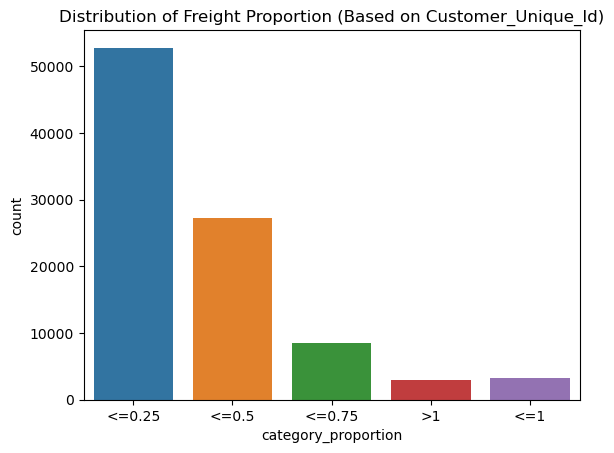

In [233]:
# Display each category_proportion distribution
sns.countplot(data=proportion_freight, x='category_proportion')
plt.title('Distribution of Freight Proportion (Based on Customer_Unique_Id)')

## Payment Methods Distribution 

In [234]:
# Create a dataframe for customer spending
df_spending = df_2.merge(df_3,on='order_id',how='left').merge(df_4,on='customer_id',how='left')
df_spending

,order_id,payment_sequential,payment_type,payment_installments,payment_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16,a8b9d3a27068454b1c98cc67d4e31e6f,2422,sao paulo,SP
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04,6f70c0b2f7552832ba46eb57b1c5651e,2652,sao paulo,SP
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04,87695ed086ebd36f20404c82d20fca87,36060,juiz de fora,MG
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13,4291db0da71914754618cd789aebcd56,18570,conchas,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31,5d576cb2dfa3bc05612c392a1ee9c654,delivered,2018-03-08 16:57:23,2018-03-10 03:55:25,2018-03-12 18:19:36,2018-03-16 13:09:51,2018-04-04,b6027ac07fb76ebca8c97b1887865aee,12954,atibaia,SP
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80,2079230c765a88530822a34a4cec2aa0,delivered,2017-08-18 09:45:35,2017-08-18 10:04:56,2017-08-18 18:04:24,2017-08-23 22:25:56,2017-09-12,53b30ca78efb2b7efcd3f9e461587eb2,30210,belo horizonte,MG
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77,e4abb5057ec8cfda9759c0dc415a8188,invoiced,2017-11-18 17:27:14,2017-11-18 17:46:05,NaT,NaT,2017-12-05,d3c7da954a324253814096bcaf240e4e,1519,sao paulo,SP
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54,5d719b0d300663188169c6560e243f27,delivered,2018-08-07 23:26:13,2018-08-07 23:45:00,2018-08-09 11:46:00,2018-08-21 22:41:46,2018-08-24,b84dc68f02f122a88d7e7bbd37b06204,22733,rio de janeiro,RJ


In [235]:
grouped_df_spending = df_spending.groupby(['customer_unique_id','payment_type']).agg({
    'payment_sequential':'max',
    'payment_installments':'max',
    'payment_value':'sum',
    'customer_city':set,
    'customer_state':set,
    }).sort_values('payment_value',ascending=False).reset_index()
grouped_df_spending

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,customer_city,customer_state
0,0a0a92112bd4c708ca5fde585afaa872,credit_card,1,1,13664.08,{rio de janeiro},{RJ}
1,da122df9eeddfedc1dc1f5349a1a690c,credit_card,1,10,7571.63,{araruama},{RJ}
2,763c8b1c9c68a0229c42c9fc6f662b93,boleto,1,1,7274.88,{vila velha},{ES}
3,dc4802a71eae9be1dd28f5d788ceb526,credit_card,1,8,6929.31,{campo grande},{MS}
4,459bef486812aa25204be022145caa62,boleto,1,1,6922.21,{vitoria},{ES}
...,...,...,...,...,...,...,...
98653,834d3682f9b03dbd791a7c8e816ab348,credit_card,1,1,0.01,{belo horizonte},{MG}
98654,967d07493b6792043f97262a0a4b15f8,credit_card,1,1,0.01,{sao paulo},{SP}
98655,4fa4365000c7090fcb8cad5713c6d3db,not_defined,1,1,0.00,{sao paulo},{SP}
98656,6ba987d564bad1f9da8e14b9d3b71c8f,not_defined,1,1,0.00,{sao paulo},{SP}


In [236]:
# payment_type percentage used for transaction

grouped_df_spending.groupby('payment_type').count()['customer_unique_id'].sort_values(ascending=False)/len(grouped_df_spending)

payment_type
credit_card    0.750998
boleto         0.195524
voucher        0.038111
debit_card     0.015336
not_defined    0.000030
Name: customer_unique_id, dtype: float64

In [237]:
# payment_value of payment_type percentage used for transaction

grouped_df_spending.groupby('payment_type').sum()['payment_value'].sort_values(ascending=False)/sum(df_spending['payment_value'])

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3931207461.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df_spending.groupby('payment_type').sum()['payment_value'].sort_values(ascending=False)/sum(df_spending['payment_value'])


payment_type
credit_card    0.783446
boleto         0.179236
voucher        0.023702
debit_card     0.013617
not_defined    0.000000
Name: payment_value, dtype: float64

From the EDA of payment_type, we can see that credit card and boleto dominate the payment method (both from transaction quantity and total payment value,with more than 80% of total data).

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


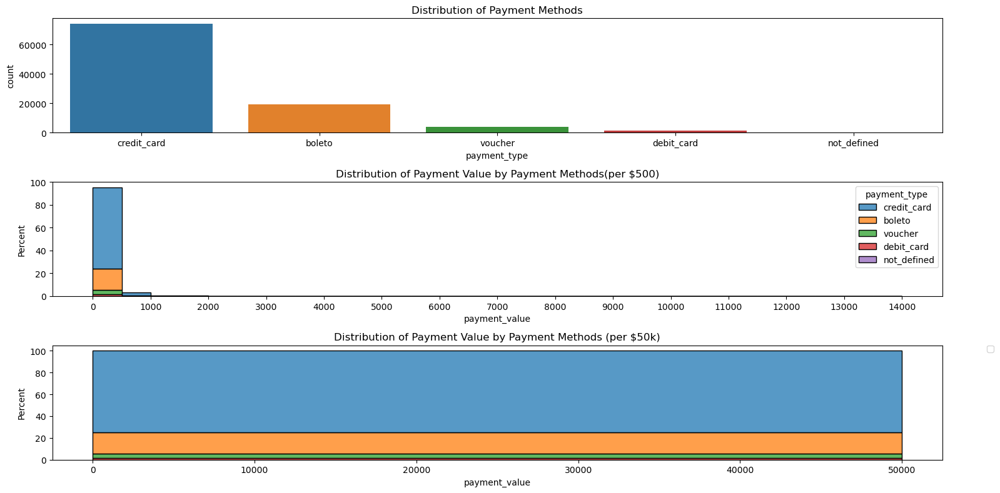

In [309]:
# Display payment_type EDA
plt.figure(figsize=(16,8))
plt.subplot(3,1,1)
plt.title('Distribution of Payment Methods')
sns.countplot(data = grouped_df_spending,x='payment_type')

plt.subplot(3,1,2)
plt.title('Distribution of Payment Value by Payment Methods(per $500)')
sns.histplot(data = grouped_df_spending,x='payment_value',binwidth=500,stat='percent',hue='payment_type',multiple='stack')
plt.xticks(ticks=range(0,15000,1000))

plt.subplot(3,1,3)
plt.title('Distribution of Payment Value by Payment Methods (per $50k)')
sns.histplot(data = grouped_df_spending,x='payment_value',binwidth=50000,stat='percent',hue='payment_type',multiple='stack')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.tight_layout();

# Modeling using RFM (Recency, Frequency, Monetary)

## Recency

### Last Purchase and Review Day

In [239]:
# Create new columns (purchase_day and review_day)
latest_purchase = grouped_df_spending_review['order_purchase_timestamp'].max()
grouped_df_spending_review['purchase_day'] = latest_purchase - grouped_df_spending_review['order_purchase_timestamp']
grouped_df_spending_review['purchase_day'] = grouped_df_spending_review['purchase_day'].dt.days
grouped_df_spending_review['review_day'] = grouped_df_spending_review['review_answer_timestamp'] - grouped_df_spending_review['review_creation_date']
grouped_df_spending_review['review_day'] = grouped_df_spending_review['review_day'].dt.days
grouped_df_spending_review

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency,purchase_day,review_day
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1,160,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,NaN,NaN,1,163,0
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,NaN,NaN,1,585,1
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,NaN,NaN,1,369,1
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,NaN,NaN,1,336,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,NaN,NaN,1,495,4
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,NaN,NaN,1,310,5
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,NaN,NaN,1,617,2
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,NaN,NaN,1,168,2


In [240]:
# Create new dataframe for 'Recency' matrix
df_recency = grouped_df_spending_review[['customer_unique_id','purchase_day','review_day']]
df_recency

,customer_unique_id,purchase_day,review_day
0,0000366f3b9a7992bf8c76cfdf3221e2,160,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,0
2,0000f46a3911fa3c0805444483337064,585,1
3,0000f6ccb0745a6a4b88665a16c9f078,369,1
4,0004aac84e0df4da2b147fca70cf8255,336,4
...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,495,4
95371,fffea47cd6d3cc0a88bd621562a9d061,310,5
95372,ffff371b4d645b6ecea244b27531430a,617,2
95373,ffff5962728ec6157033ef9805bacc48,168,2


We will drop all data with purchase_day > 1 year (365 days) because we assume that these customers are included in a special cluster (inactive customer) that we will make manually (without machine learning algorithm).

In [241]:
df_recency_active = df_recency[df_recency['purchase_day']<=365]
df_recency_notact = df_recency[df_recency['purchase_day']>365]

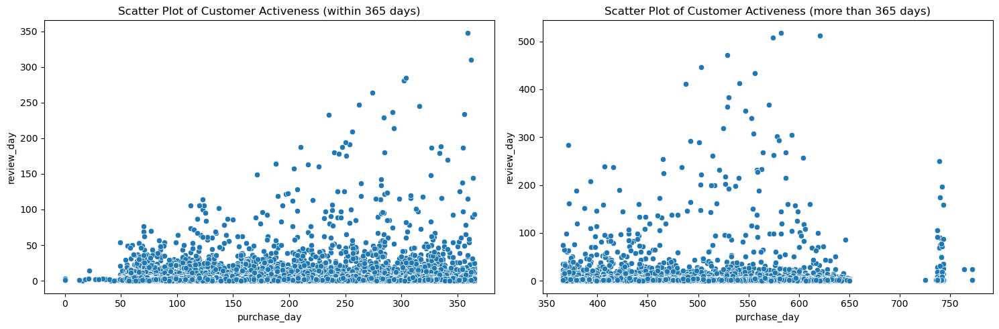

In [242]:
# Showing customer activeness
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.scatterplot(
    data=df_recency_active,
    x='purchase_day',
    y='review_day'
)
plt.title('Scatter Plot of Customer Activeness (within 365 days)')

plt.subplot(1,2,2)
sns.scatterplot(
    data=df_recency_notact,
    x='purchase_day',
    y='review_day'
)
plt.title('Scatter Plot of Customer Activeness (more than 365 days)')
plt.tight_layout()


### Clustering with K-Means

### Scaling

In [243]:
# Create scaler using robust scaler because our data has many outliers
scaler = RobustScaler()
recency = df_recency_active[['purchase_day','review_day']]
recency_scaled = scaler.fit_transform(recency)
recency_scaled

array([[-0.31125828,  1.        ],
       [-0.29139073, -0.33333333],
       [ 0.85430464,  1.        ],
       ...,
       [-0.1192053 ,  4.        ],
       [ 0.68211921,  1.33333333],
       [-0.25827815,  0.33333333]])

In [244]:
# Create a dataframe that contains a range of k in n_clusters and its inertia
list_k = range(1,10)
list_inertia = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(recency_scaled)

    inertia = kmeans.inertia_
    list_inertia.append(inertia)

# --------------------------------
df_iner_recency_scaled = pd.DataFrame({
    'k': list_k,
    'inertia': list_inertia
})

df_iner_recency_scaled 

,k,inertia
0,1,385641.672017
1,2,175555.096776
2,3,110239.292232
3,4,79022.023757
4,5,60735.392642
5,6,44556.471027
6,7,35633.178911
7,8,29572.916902
8,9,25751.103807


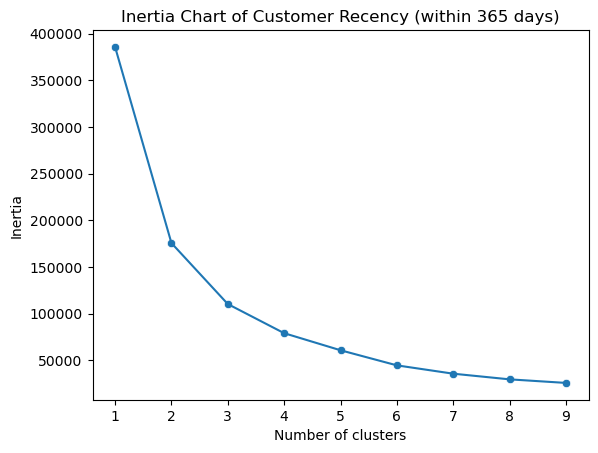

In [245]:
# Finding the best k value by using Elbow Method
sns.scatterplot(data=df_iner_recency_scaled, x='k', y='inertia')
sns.lineplot(data=df_iner_recency_scaled, x='k', y='inertia')
plt.title('Inertia Chart of Customer Recency (within 365 days)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia');

In [246]:
# Finding the best k value by using calculating the silhouette score
list_k = range(2,10)
list_sil = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(recency_scaled)
    cluster = kmeans.labels_
    
    sil = silhouette_score(recency_scaled, cluster)
    list_sil.append(sil)
    df_recency_active[f'cluster_{k}'] = cluster
    

# --------------------------------
df_sil = pd.DataFrame({
    'k': list_k,
    'sil_score': list_sil
})

df_sil.sort_values('sil_score', ascending=False)

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\432081820.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recency_active[f'cluster_{k}'] = cluster
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\432081820.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recency_active[f'cluster_{k}'] = cluster
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\432081820.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

,k,sil_score
0,2,0.964721
1,3,0.871150
2,4,0.770364
3,5,0.578538
5,7,0.425570
6,8,0.425503
4,6,0.406738
7,9,0.403054


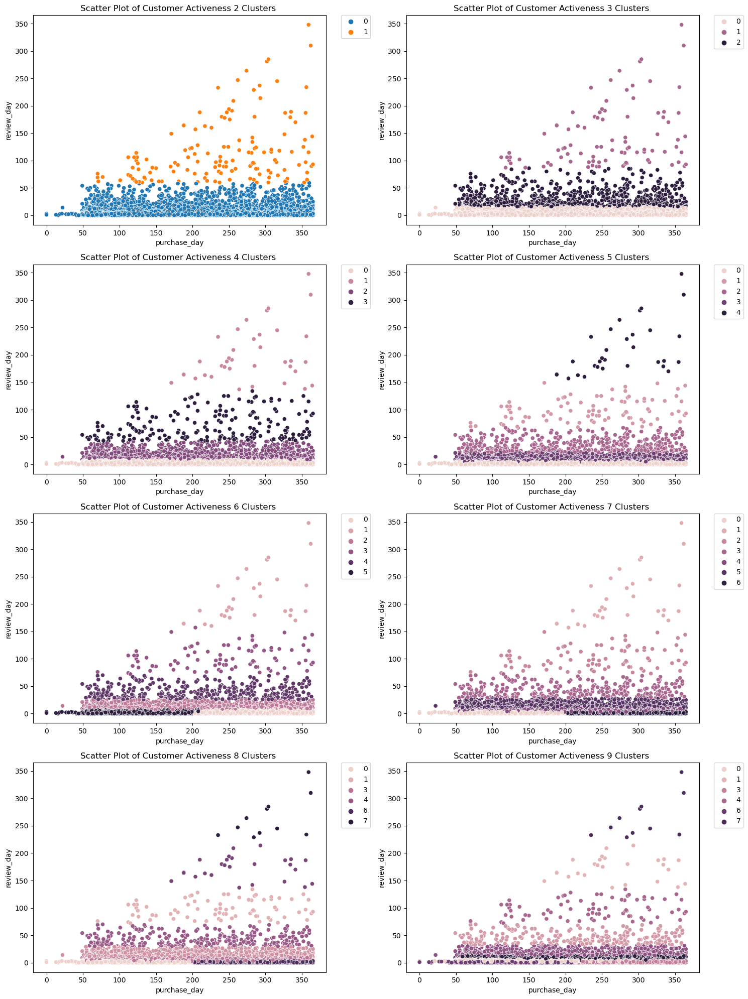

In [247]:
# Comparing the data with several cluster numbers
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=df_recency_active,x='purchase_day',y='review_day',hue=f'cluster_{k}')
    plt.title(f'Scatter Plot of Customer Activeness {k} Clusters ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    a+=1
    plt.tight_layout()


We will use 3 cluster numbers for active customer recency matrix based on the Elbow Method silhouette score, and the scatter plot.

On the other hand, we will use 1 cluster for inactive customer (purchase_day > 365) that we will make manually.

So, the total cluster number for 'Recency' matrix is 4.

In [248]:
# Create the cluster for inactive customers
df_recency_notact['Rlabel']=1
df_recency_notact

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\477509200.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recency_notact['Rlabel']=1


,customer_unique_id,purchase_day,review_day,Rlabel
2,0000f46a3911fa3c0805444483337064,585,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,1
8,0005e1862207bf6ccc02e4228effd9a0,591,6,1
10,0006fdc98a402fceb4eb0ee528f6a8d4,456,4,1
14,000a5ad9c4601d2bbdd9ed765d5213b3,432,1,1
...,...,...,...,...
95360,fff3a9369e4b7102fab406a334a678c3,432,6,1
95363,fff699c184bcc967d62fa2c6171765f7,411,1,1
95370,fffcf5a5ff07b0908bd4e2dbc735a684,495,4,1
95372,ffff371b4d645b6ecea244b27531430a,617,2,1


In [249]:
df_recency_active2 = df_recency_active[['customer_unique_id','purchase_day','review_day','cluster_3']].rename(columns={'cluster_3':'Rlabel'})
df_recency_active2['Rlabel'].replace([0,1,2],[4,3,2],inplace=True)
df_recency_final = pd.concat([df_recency_active2,df_recency_notact])
df_recency_final

,customer_unique_id,purchase_day,review_day,Rlabel
0,0000366f3b9a7992bf8c76cfdf3221e2,160,4,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,0,4
4,0004aac84e0df4da2b147fca70cf8255,336,4,4
5,0004bd2a26a76fe21f786e4fbd80607f,194,2,4
6,00050ab1314c0e55a6ca13cf7181fecf,180,3,4
...,...,...,...,...
95360,fff3a9369e4b7102fab406a334a678c3,432,6,1
95363,fff699c184bcc967d62fa2c6171765f7,411,1,1
95370,fffcf5a5ff07b0908bd4e2dbc735a684,495,4,1
95372,ffff371b4d645b6ecea244b27531430a,617,2,1


In [250]:
df_recency_final.describe()

,purchase_day,review_day,Rlabel
count,95375.000000,95375.000000,95375.000000
mean,287.578705,2.590176,3.095906
std,153.415247,9.949167,1.369228
min,0.000000,0.000000,1.000000
25%,163.000000,1.000000,1.000000
50%,268.000000,1.000000,4.000000
75%,397.000000,3.000000,4.000000
max,772.000000,518.000000,4.000000


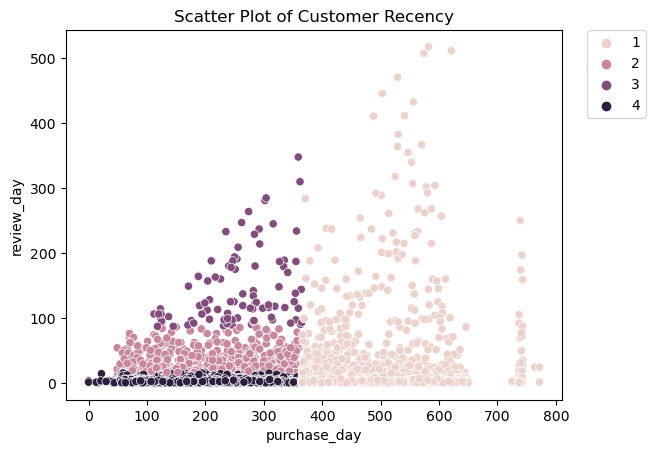

In [251]:
# Showing the cluster of customer recency
plt.title(f'Scatter Plot of Customer Recency')
sns.scatterplot(data=df_recency_final,x='purchase_day',y='review_day',hue='Rlabel')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0);

In [252]:
df_recency_final.groupby('Rlabel').agg({
    'purchase_day' : ['mean','min','max','std'],
    'review_day' : ['mean','min','max','std'],
    'Rlabel' : 'count'
})

purchase_day                       review_day                      \
               mean  min  max        std        mean min  max        std   
Rlabel                                                                     
1        483.568763  366  772  79.146506    3.122276   0  518  14.809662   
2        213.987342   49  365  89.120297   29.413119  16   86  14.856560   
3        257.384615  112  365  68.544514  143.901099  87  348  57.273623   
4        205.398177    0  365  89.263323    1.818654   0   15   2.106094   

       Rlabel  
        count  
Rlabel         
1       28133  
2         869  
3          91  
4       66282

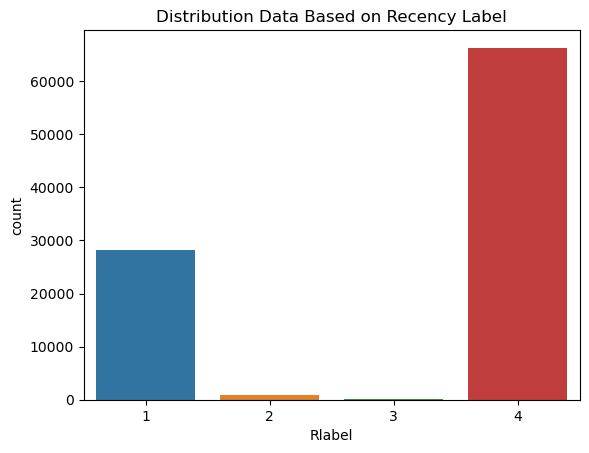

In [253]:
plt.title('Distribution Data Based on Recency Label')
sns.countplot(x=df_recency_final['Rlabel']);

## Frequency

In [254]:
# Create a new dataframe for 'Frequency' matrix
df_frequency = grouped_df_spending_review[['customer_unique_id','transaction_frequency']]
df_frequency

,customer_unique_id,transaction_frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,1
95371,fffea47cd6d3cc0a88bd621562a9d061,1
95372,ffff371b4d645b6ecea244b27531430a,1
95373,ffff5962728ec6157033ef9805bacc48,1


In [255]:
freq = df_frequency[['transaction_frequency']]

In [256]:
# Create a dataframe that contains a range of k in n_clusters and its inertia
list_k = range(1,10)
list_inertia = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(freq)

    inertia = kmeans.inertia_
    list_inertia.append(inertia)

# --------------------------------
df_iner_freq = pd.DataFrame({
    'k': list_k,
    'inertia': list_inertia
})

df_iner_freq 

,k,inertia
0,1,4.407314e+03
1,2,7.994699e+02
2,3,3.594286e+02
3,4,1.599472e+02
4,5,4.591512e+01
5,6,1.471579e+01
6,7,6.428571e+00
7,8,2.000000e+00
8,9,2.153415e-24


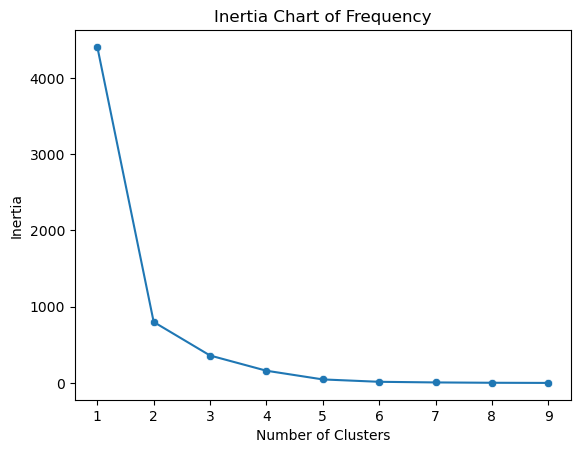

In [257]:
# Finding the best k by using Elbow Method
sns.scatterplot(data=df_iner_freq, x='k', y='inertia')
sns.lineplot(data=df_iner_freq, x='k', y='inertia')
plt.title('Inertia Chart of Frequency')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia');

In [258]:
# Finding the best k from its silhouette score
list_k = range(2,10)
list_sil = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(freq)

    cluster = kmeans.labels_
    sil = silhouette_score(freq, cluster)
    list_sil.append(sil)
    df_frequency[f'cluster_{k}'] = cluster
    

# --------------------------------
df_sil_freq = pd.DataFrame({
    'k': list_k,
    'sil_score': list_sil
})

df_sil_freq.sort_values('sil_score', ascending=False)

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\2449546656.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frequency[f'cluster_{k}'] = cluster
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\2449546656.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frequency[f'cluster_{k}'] = cluster
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\2449546656.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value i

,k,sil_score
7,9,0.999979
6,8,0.999944
5,7,0.999906
4,6,0.999840
3,5,0.999491
2,4,0.999327
1,3,0.998893
0,2,0.995294


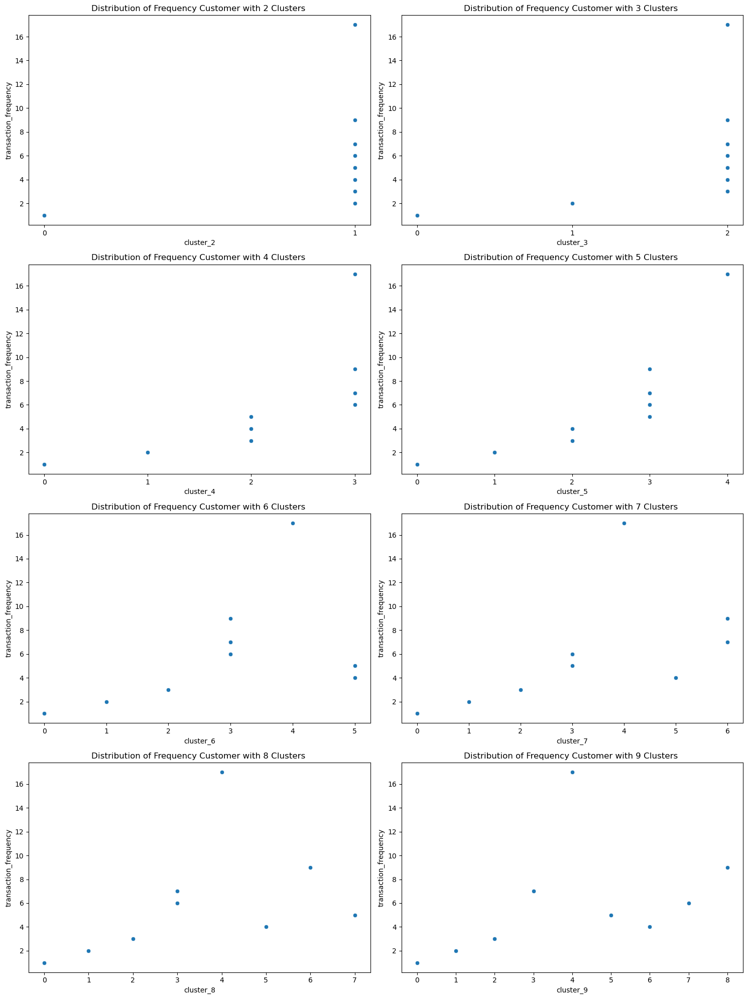

In [259]:
# Showing the cluster result in scatter plot
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=df_frequency,x=f'cluster_{k}',y='transaction_frequency')
    plt.title(f'Distribution of Frequency Customer with {k} Clusters ')
    plt.xticks(range(k))
    a+=1
    plt.tight_layout()


We will use 2 clusters for 'Frequency' matrix, based from the Elbow Method, silhouette score, and scatter plot.

In [260]:
df_frequency_final = df_frequency[['customer_unique_id','transaction_frequency','cluster_2']]
df_frequency_final['cluster_2'] = df_frequency['cluster_2'].replace([0,1],[1,2])
df_frequency_final = df_frequency_final.rename(columns={'cluster_2':'Flabel'})
df_frequency_final

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\364211452.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_frequency_final['cluster_2'] = df_frequency['cluster_2'].replace([0,1],[1,2])


,customer_unique_id,transaction_frequency,Flabel
0,0000366f3b9a7992bf8c76cfdf3221e2,1,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,1
2,0000f46a3911fa3c0805444483337064,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,1,1
4,0004aac84e0df4da2b147fca70cf8255,1,1
...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,1,1
95371,fffea47cd6d3cc0a88bd621562a9d061,1,1
95372,ffff371b4d645b6ecea244b27531430a,1,1
95373,ffff5962728ec6157033ef9805bacc48,1,1


In [261]:
df_frequency_final.groupby('Flabel').agg({
    'transaction_frequency' : ['mean','min','max','std'],
    'Flabel' : ['count']
})

transaction_frequency                   Flabel
                        mean min max       std  count
Flabel                                               
1                   1.000000   1   1  0.000000  92387
2                   2.116466   2  17  0.517349   2988

## Monetary

In [262]:
# Create a new dataframe to see payment_value for each customer_unique_id
df_payment = grouped_df_spending_review[['customer_unique_id','payment_value']]
df_payment

,customer_unique_id,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89
...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,2067.42
95371,fffea47cd6d3cc0a88bd621562a9d061,84.58
95372,ffff371b4d645b6ecea244b27531430a,112.46
95373,ffff5962728ec6157033ef9805bacc48,133.69


In [263]:
payment = df_payment[['payment_value']]

In [264]:
# Create a new dataframe that contains a range of k (1-9) with its inertia
list_k = range(1,10)
list_inertia_pay = []

for k in list_k:

    kmeans_pay = KMeans(n_clusters= k, random_state=0)
    kmeans_pay.fit(payment)

    inertia_pay = kmeans_pay.inertia_
    list_inertia_pay.append(inertia_pay)

# --------------------------------
df_iner_pay = pd.DataFrame({
    'k': list_k,
    'inertia': list_inertia_pay
})

df_iner_pay 

,k,inertia
0,1,5.052630e+09
1,2,2.323389e+09
2,3,1.395677e+09
3,4,9.562013e+08
4,5,6.804625e+08
5,6,4.967521e+08
6,7,3.612769e+08
7,8,2.750653e+08
8,9,2.230905e+08


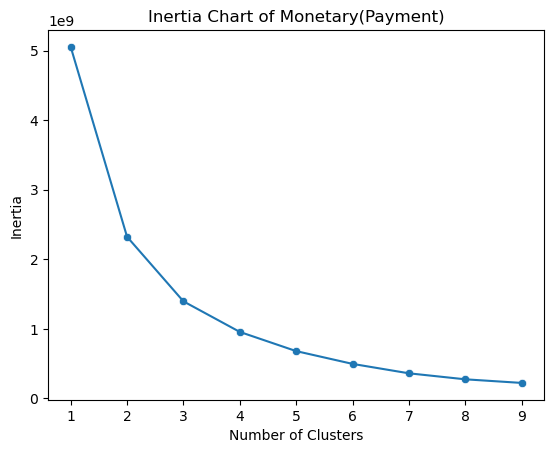

In [265]:
# Finding the best k by using Elbow Method
sns.scatterplot(data=df_iner_pay, x='k', y='inertia')
sns.lineplot(data=df_iner_pay, x='k', y='inertia')
plt.title('Inertia Chart of Monetary(Payment)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia');

In [266]:
# Finding the best k by using its silhouette score
list_k = range(2,10)
list_sil_pay = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(payment)

    cluster_pay = kmeans.labels_
    sil = silhouette_score(payment, cluster_pay)
    list_sil_pay.append(sil)
    df_payment[f'cluster_{k}'] = cluster_pay

# --------------------------------
df_sil_pay = pd.DataFrame({
    'k': list_k,
    'sil_score': list_sil_pay
})

df_sil_pay.sort_values('sil_score', ascending=False)

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\480609280.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_payment[f'cluster_{k}'] = cluster_pay
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\480609280.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_payment[f'cluster_{k}'] = cluster_pay
C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\480609280.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

,k,sil_score
0,2,0.857711
1,3,0.751246
2,4,0.661269
3,5,0.642080
4,6,0.630983
5,7,0.603248
6,8,0.600520
7,9,0.577252


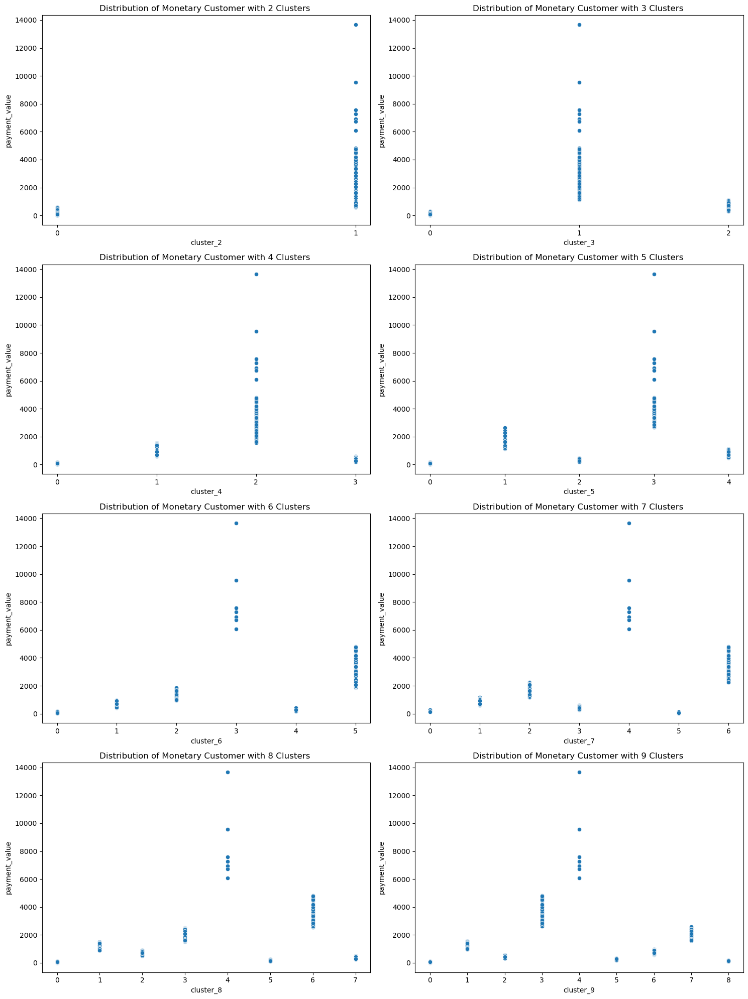

In [267]:
# Show the cluster result on scatter plot
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=df_payment,x=f'cluster_{k}',y='payment_value')
    plt.title(f'Distribution of Monetary Customer with {k} Clusters ')
    plt.xticks(range(k))
    a+=1
    plt.tight_layout()


In [268]:
df_payment_final = df_payment[['customer_unique_id','payment_value','cluster_4']]
df_payment_final['cluster_4'] = df_payment_final['cluster_4'].replace([0,1,2,3],[1,3,2,4])
df_payment_final = df_payment_final.rename(columns={'cluster_4':'Mlabel_payment'})
df_payment_final 

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\2581579522.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_payment_final['cluster_4'] = df_payment_final['cluster_4'].replace([0,1,2,3],[1,3,2,4])


,customer_unique_id,payment_value,Mlabel_payment
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1
2,0000f46a3911fa3c0805444483337064,86.22,1
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,1
...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,2067.42,2
95371,fffea47cd6d3cc0a88bd621562a9d061,84.58,1
95372,ffff371b4d645b6ecea244b27531430a,112.46,1
95373,ffff5962728ec6157033ef9805bacc48,133.69,1


In [269]:
df_payment_final.groupby('Mlabel_payment').agg({
    'payment_value' : ['mean','min','max','std'],
    'Mlabel_payment' : ['count']
})

payment_value                                 Mlabel_payment
                        mean      min       max          std          count
Mlabel_payment                                                             
1                  93.621888     9.59    198.41    46.717400          74537
2                2275.263224  1568.72  13664.08  1035.879355            425
3                 861.642064   582.94   1564.07   246.317424           3071
4                 303.744254   198.43    582.32    93.711402          17342

## RFM Table

In [270]:
# Create a new dataframe for RFM clustering
df_rfm_final = grouped_df_spending_review.merge(df_recency_final[['customer_unique_id','Rlabel']],how='left',on='customer_unique_id',).merge(
    df_frequency_final[['customer_unique_id','Flabel']],how='left',on='customer_unique_id').merge(df_payment_final[['customer_unique_id','Mlabel_payment']],how='left',on='customer_unique_id')

### Equalize value for 'Frequency' matrix

In [271]:
df_rfm_final.iloc[:,-3:].max()

Rlabel            4
Flabel            2
Mlabel_payment    4
dtype: int64

In [272]:
df_rfm_final['Flabel'] = df_rfm_final['Flabel']*2
df_rfm_final

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency,purchase_day,review_day,Rlabel,Flabel,Mlabel_payment
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1,160,4,4,2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,NaN,NaN,1,163,0,4,2,1
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,NaN,NaN,1,585,1,1,2,1
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,NaN,NaN,1,369,1,1,2,1
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,NaN,NaN,1,336,4,4,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,NaN,NaN,1,495,4,1,2,2
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,NaN,NaN,1,310,5,4,2,1
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,NaN,NaN,1,617,2,1,2,1
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,NaN,NaN,1,168,2,4,2,1


In [273]:
df_rfm_final.iloc[:,-3:].max()

Rlabel            4
Flabel            4
Mlabel_payment    4
dtype: int64

### Sum without Weighting

In [274]:
df_rfm_final['sum_label'] = df_rfm_final['Rlabel'] + df_rfm_final['Flabel'] + df_rfm_final['Mlabel_payment']
df_rfm_final

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency,purchase_day,review_day,Rlabel,Flabel,Mlabel_payment,sum_label
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1,160,4,4,2,1,7
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,NaN,NaN,1,163,0,4,2,1,7
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,NaN,NaN,1,585,1,1,2,1,4
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,NaN,NaN,1,369,1,1,2,1,4
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,NaN,NaN,1,336,4,4,2,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,NaN,NaN,1,495,4,1,2,2,5
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,NaN,NaN,1,310,5,4,2,1,7
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,NaN,NaN,1,617,2,1,2,1,4
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,NaN,NaN,1,168,2,4,2,1,7


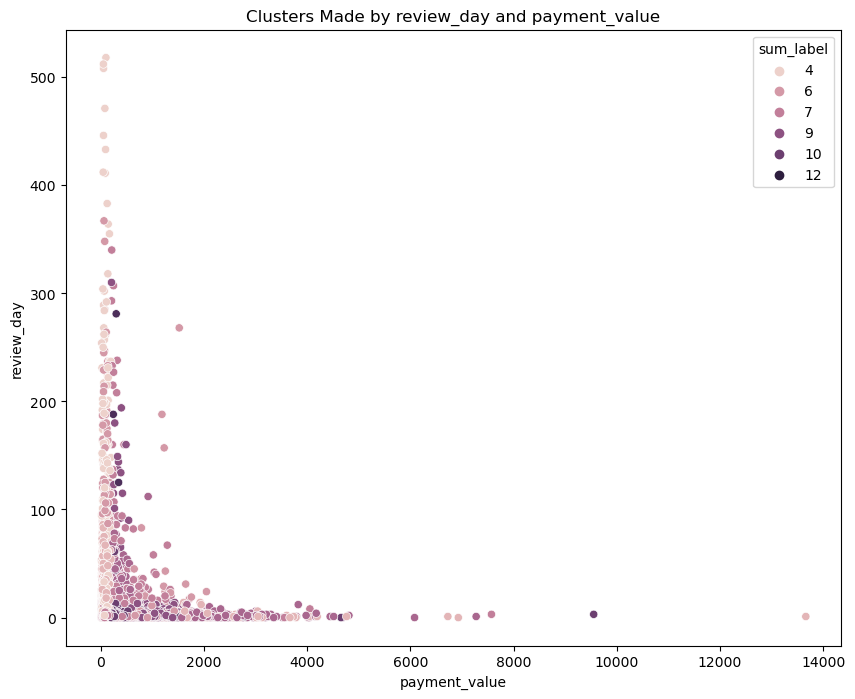

In [275]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='review_day',hue='sum_label')
plt.title('Clusters Made by review_day and payment_value');

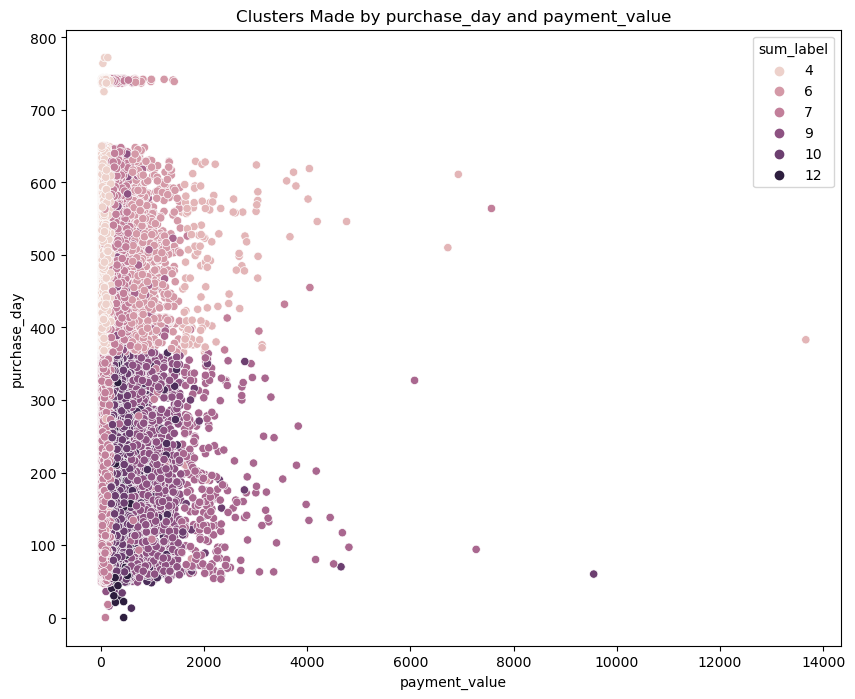

In [276]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='purchase_day',hue='sum_label')
plt.title('Clusters Made by purchase_day and payment_value' );


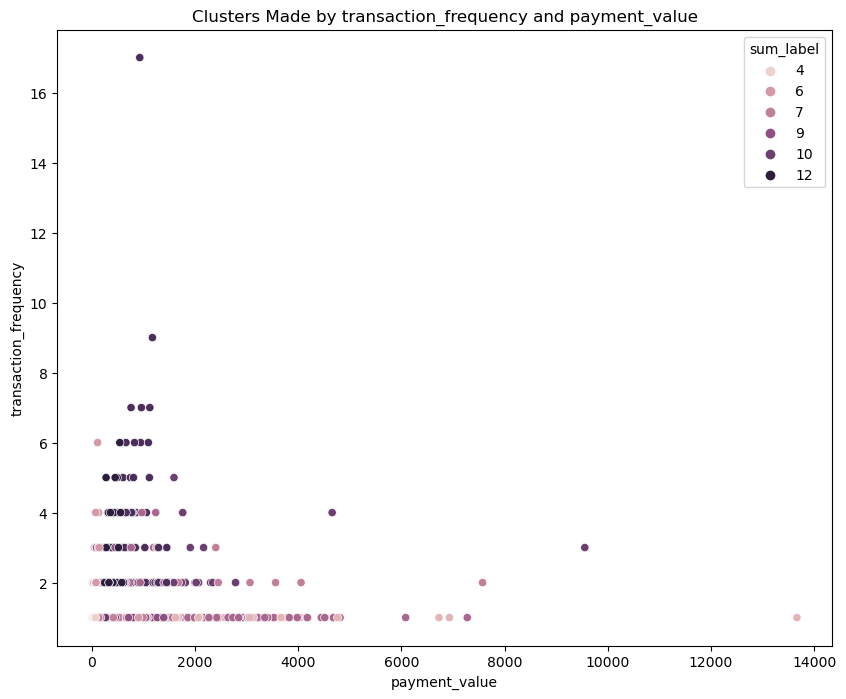

In [277]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='transaction_frequency',hue='sum_label')
plt.title('Clusters Made by transaction_frequency and payment_value' );


### Sum with Weighting

In this business model we assume that 'Monetary' matrix is twice more important than the others.

Recency : 25%

Frequency : 25%

Monetary : 50%

In [278]:
# Give 'weight' for each matrix label
df_rfm_final['sum_weighted_label'] = round(df_rfm_final['Rlabel']*0.25 + df_rfm_final['Flabel']*0.25 + df_rfm_final['Mlabel_payment']*0.5,0)
df_rfm_final['sum_weighted_label'] = df_rfm_final['sum_weighted_label'].astype('int')
df_rfm_final

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,voucher,debit_card,transaction_frequency,purchase_day,review_day,Rlabel,Flabel,Mlabel_payment,sum_label,sum_weighted_label
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,NaN,NaN,1,160,4,4,2,1,7,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,NaN,NaN,1,163,0,4,2,1,7,2
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,NaN,NaN,1,585,1,1,2,1,4,1
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,NaN,NaN,1,369,1,1,2,1,4,1
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,NaN,NaN,1,336,4,4,2,1,7,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,NaN,NaN,1,495,4,1,2,2,5,2
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,NaN,NaN,1,310,5,4,2,1,7,2
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,NaN,NaN,1,617,2,1,2,1,4,1
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,NaN,NaN,1,168,2,4,2,1,7,2


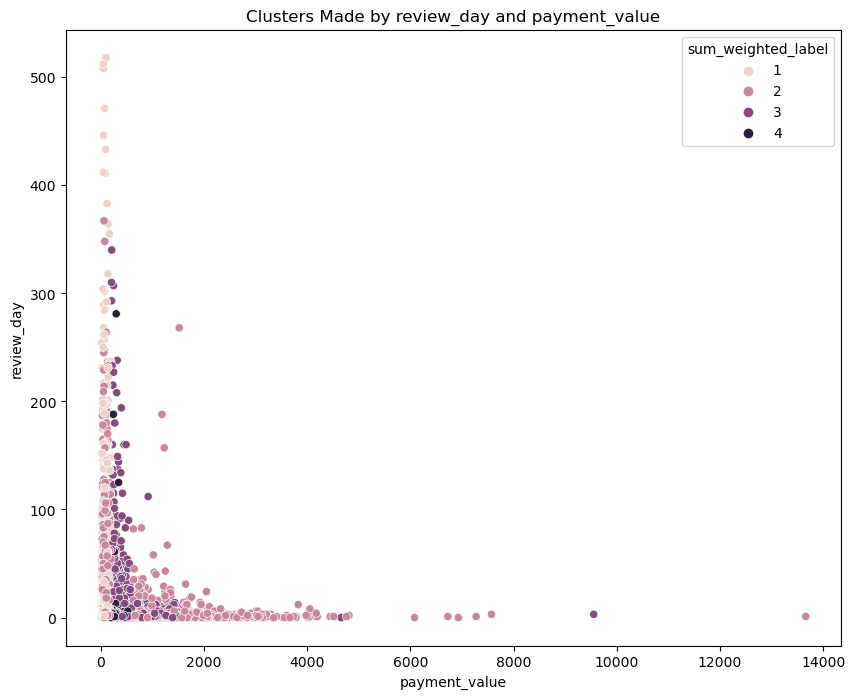

In [279]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='review_day',hue='sum_weighted_label')
plt.title('Clusters Made by review_day and payment_value' );

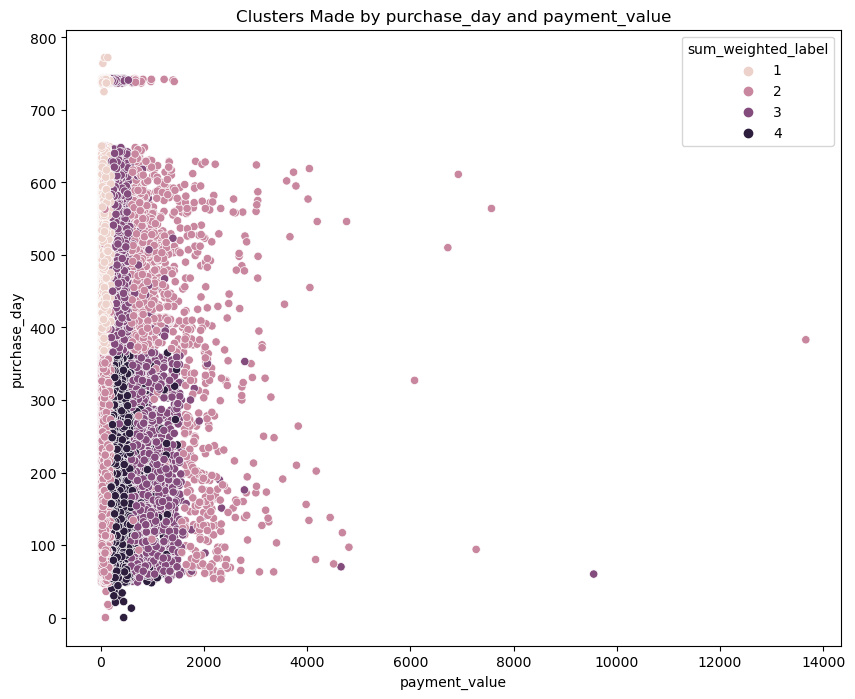

In [280]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='purchase_day',hue='sum_weighted_label')
plt.title('Clusters Made by purchase_day and payment_value' );


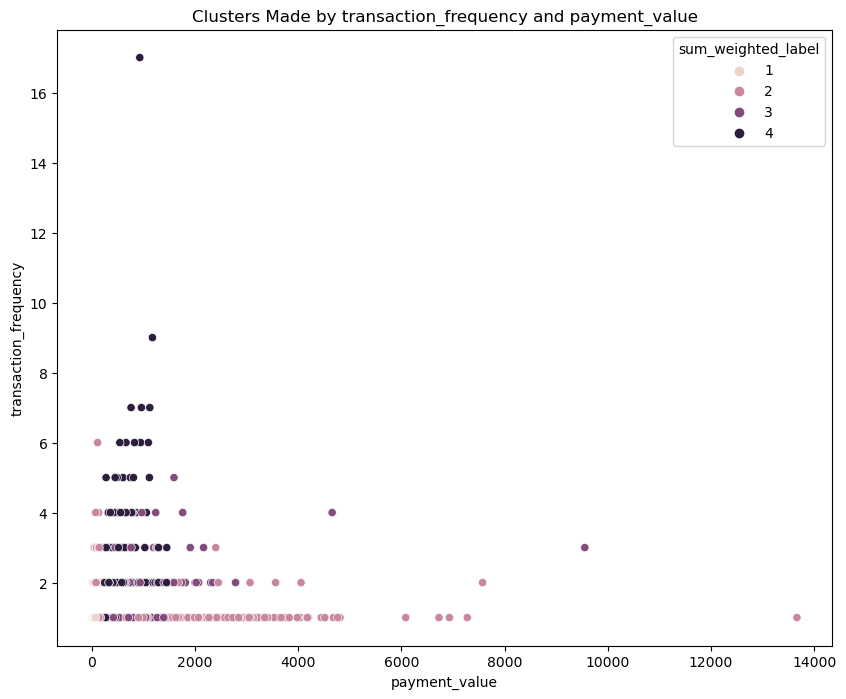

In [281]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_rfm_final,x='payment_value',y='transaction_frequency',hue='sum_weighted_label')
plt.title('Clusters Made by transaction_frequency and payment_value' );


In [282]:
# Displaying 3D scatter plot to show the full image of RFM cluster result
fig = px.scatter_3d(df_rfm_final, x='Rlabel', y='Flabel', z='Mlabel_payment',
                    color='sum_weighted_label')
fig.show()

## All Features Clustered Together

In [283]:
# Create a new dataframe for RFM clustering using all features
all_clustered = grouped_df_spending_review[['customer_unique_id', 'purchase_day', 'review_day', 'transaction_frequency', 'credit_card', 'boleto', 'voucher', 'debit_card','payment_value']]
all_clustered

,customer_unique_id,purchase_day,review_day,transaction_frequency,credit_card,boleto,voucher,debit_card,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,160,4,1,141.90,NaN,NaN,NaN,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,0,1,27.19,NaN,NaN,NaN,27.19
2,0000f46a3911fa3c0805444483337064,585,1,1,86.22,NaN,NaN,NaN,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,1,43.62,NaN,NaN,NaN,43.62
4,0004aac84e0df4da2b147fca70cf8255,336,4,1,196.89,NaN,NaN,NaN,196.89
...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,495,4,1,2067.42,NaN,NaN,NaN,2067.42
95371,fffea47cd6d3cc0a88bd621562a9d061,310,5,1,84.58,NaN,NaN,NaN,84.58
95372,ffff371b4d645b6ecea244b27531430a,617,2,1,112.46,NaN,NaN,NaN,112.46
95373,ffff5962728ec6157033ef9805bacc48,168,2,1,133.69,NaN,NaN,NaN,133.69


In [284]:
# Scale the data with robust scaler
scaler = RobustScaler()
all_clustering = all_clustered.drop(columns=['customer_unique_id','credit_card','boleto','voucher','debit_card'])
all_clustering = scaler.fit_transform(all_clustering)
pd.DataFrame(all_clustering, columns=['purchase_day','review_day','transaction_frequency','payment_value'])

,purchase_day,review_day,transaction_frequency,payment_value
0,-0.461538,1.5,0.0,0.282954
1,-0.448718,-0.5,0.0,-0.672246
2,1.354701,0.0,0.0,-0.180698
3,0.431624,0.0,0.0,-0.535432
4,0.290598,1.5,0.0,0.740861
...,...,...,...,...
95370,0.970085,1.5,0.0,16.316929
95371,0.179487,2.0,0.0,-0.194354
95372,1.491453,0.5,0.0,0.037805
95373,-0.427350,0.5,0.0,0.214589


In [285]:
# Create a new dataframe containing a range of k (1-9) and its inertia
list_k = range(1,10)
list_inertia = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(all_clustering)

    inertia = kmeans.inertia_
    list_inertia.append(inertia)
# --------------------------------
df_iner_all_clustering = pd.DataFrame({
    'k': list_k,
    'inertia': list_inertia
})
df_iner_all_clustering 

,k,inertia
0,1,2.755925e+06
1,2,1.248715e+06
2,3,8.751408e+05
3,4,6.865163e+05
4,5,5.219312e+05
5,6,4.262344e+05
6,7,3.627737e+05
7,8,3.022440e+05
8,9,2.661152e+05


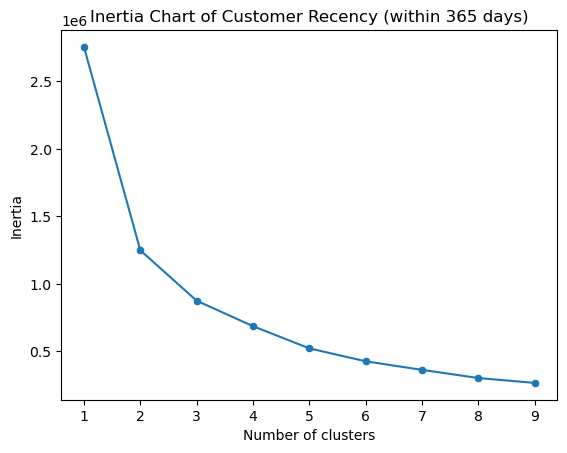

In [286]:
# Finding the best k by using Elbow Method
sns.scatterplot(data=df_iner_all_clustering, x='k', y='inertia')
sns.lineplot(data=df_iner_all_clustering, x='k', y='inertia')
plt.title('Inertia Chart of Customer Recency (within 365 days)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia');

In [287]:
# Finding the best k by using its silhouette score
list_k = range(2,10)
list_sil = []

for k in list_k:

    kmeans = KMeans(n_clusters= k, random_state=0)
    kmeans.fit(all_clustering)
    cluster = kmeans.labels_
    
    sil = silhouette_score(all_clustering, cluster)
    list_sil.append(sil)
    all_clustered[f'cluster_{k}'] = cluster
    

# --------------------------------
df_sil_all_clustering = pd.DataFrame({
    'k': list_k,
    'sil_score': list_sil
})

df_sil_all_clustering.sort_values('sil_score', ascending=False)

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3785103783.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3785103783.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\3785103783.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

,k,sil_score
0,2,0.968124
1,3,0.930643
4,6,0.737423
3,5,0.737100
2,4,0.726263
5,7,0.547446
6,8,0.537930
7,9,0.339015


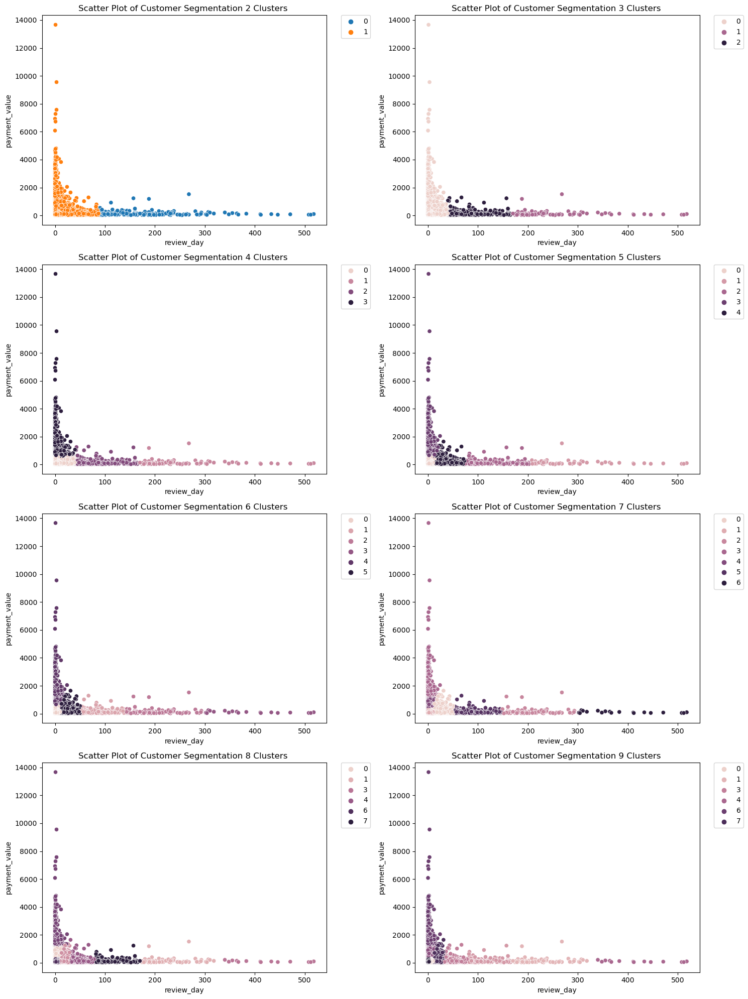

In [288]:
# Show the cluster result with various number of k (2-9) by using payment_value and review_day
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=all_clustered,x='review_day',y='payment_value',hue=f'cluster_{k}')
    plt.title(f'Scatter Plot of Customer Segmentation {k} Clusters ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    a+=1
    plt.tight_layout()


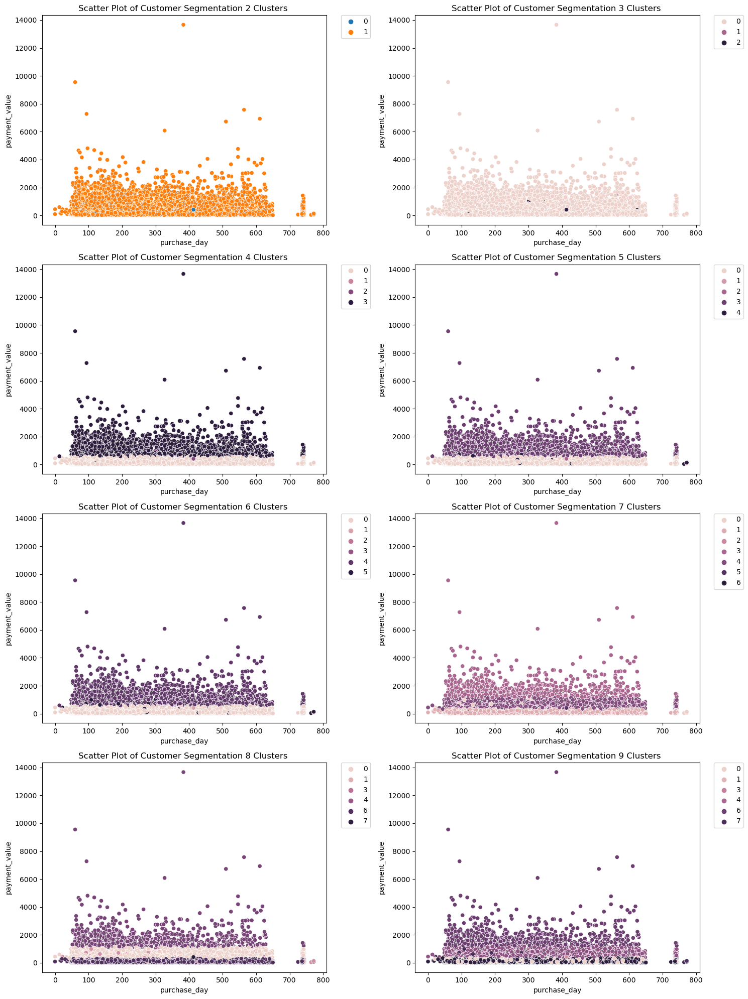

In [289]:
# # Show the cluster result with various number of k (2-9) by using payment_value and purchase_day
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=all_clustered,x='purchase_day',y='payment_value',hue=f'cluster_{k}')
    plt.title(f'Scatter Plot of Customer Segmentation {k} Clusters ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    a+=1
    plt.tight_layout()


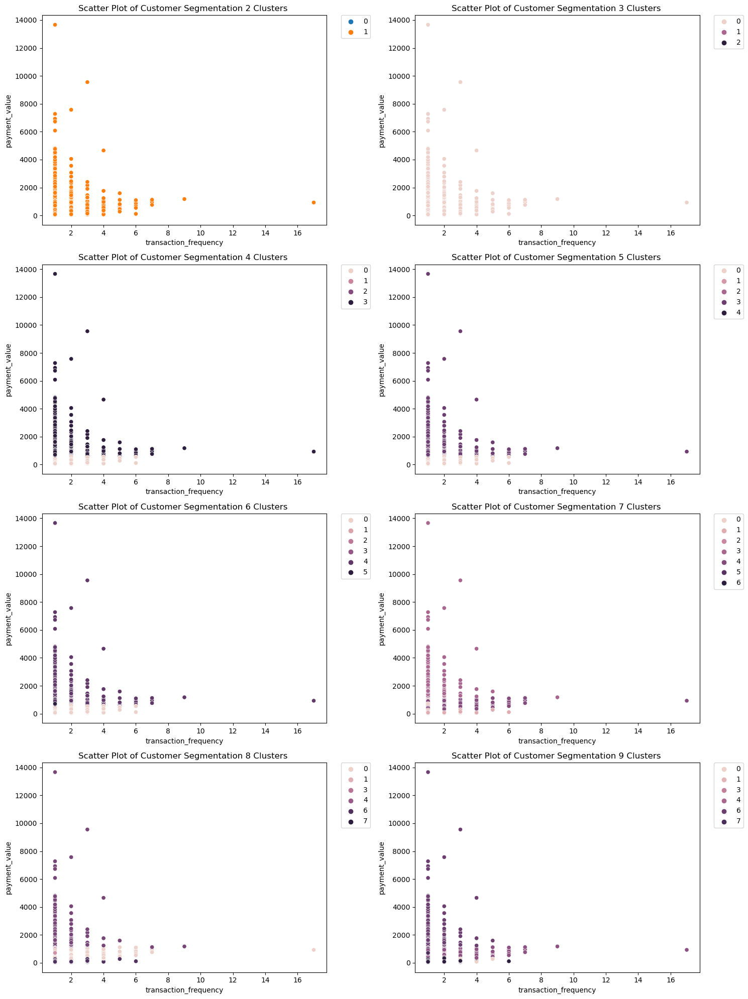

In [290]:
# Show the cluster result with various number of k (2-9) by using payment_value and transaction_frequency
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=all_clustered,x='transaction_frequency',y='payment_value',hue=f'cluster_{k}')
    plt.title(f'Scatter Plot of Customer Segmentation {k} Clusters ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    a+=1
    plt.tight_layout()


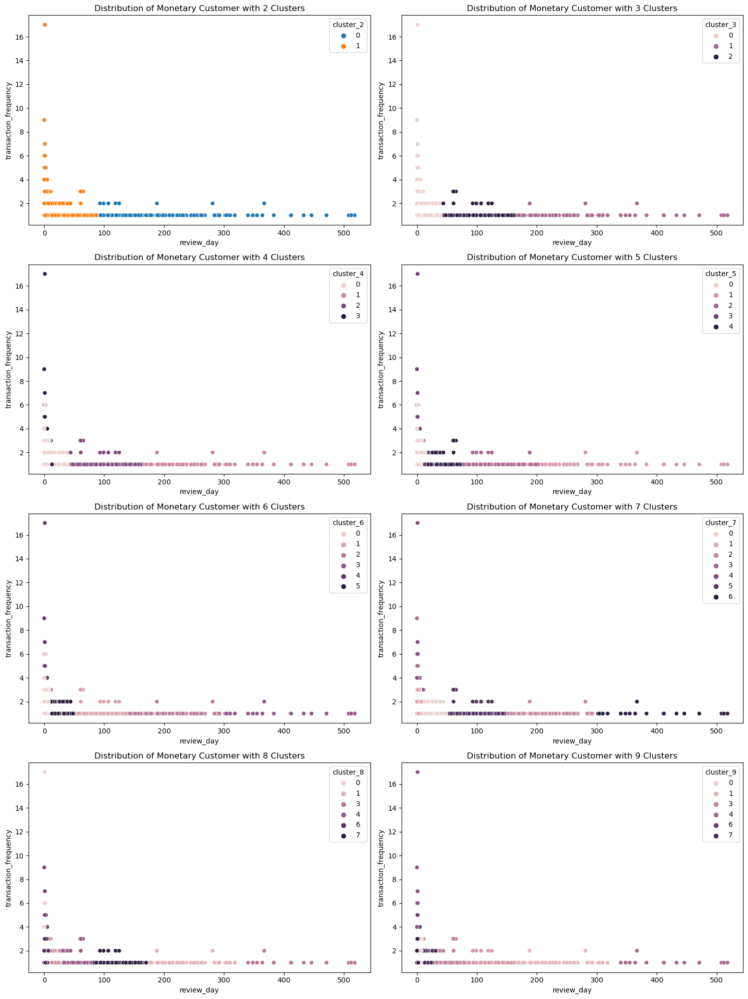

In [291]:
# Show the cluster result with various number of k (2-9) by using transaction_frequency and review_day
list_k = range(2,10)
plt.figure(figsize=(15,20))
a =1
for k in list_k:
    plt.subplot(4,2,a)
    sns.scatterplot(data=all_clustered,hue=f'cluster_{k}',y='transaction_frequency',x='review_day')
    plt.title(f'Distribution of Monetary Customer with {k} Clusters')
    a+=1
    plt.tight_layout()


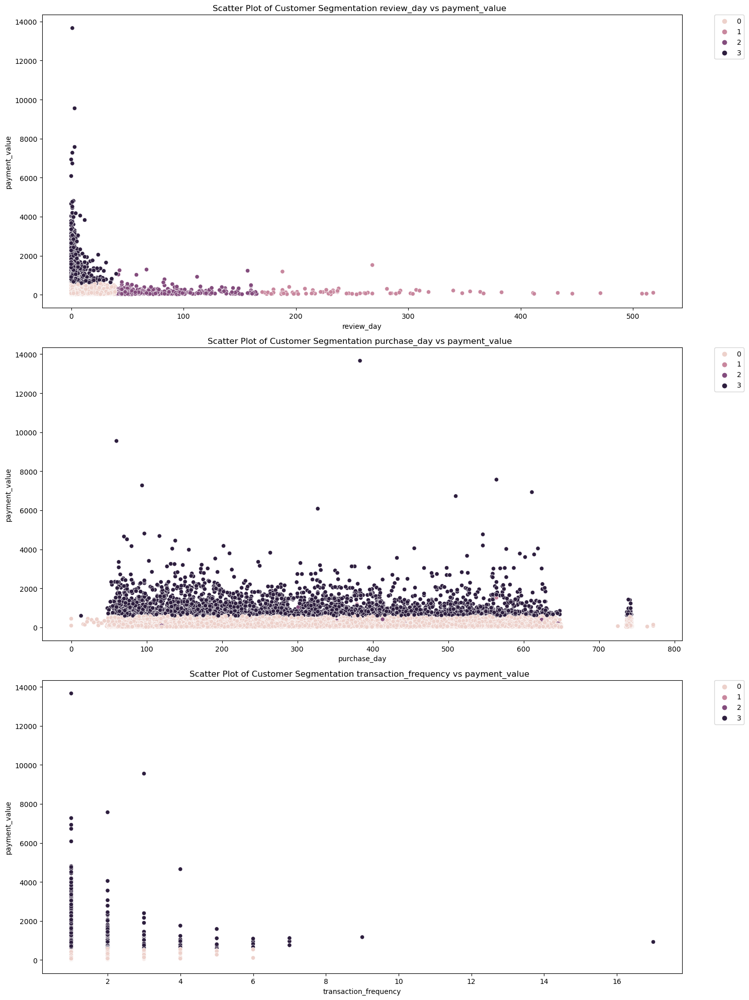

In [292]:
# Show the cluster result with 4 clusters
k = 4
a = ['payment_value', 'review_day']
b = ['payment_value', 'purchase_day']
c = ['payment_value', 'transaction_frequency']

list_table = [a,b,c]

plt.figure(figsize=(15,20))
a =1
for table in list_table:
    plt.subplot(3,1,a)
    sns.scatterplot(data=all_clustered,x=table[1],y=table[0],hue=f'cluster_{k}')
    plt.title(f'Scatter Plot of Customer Segmentation {table[1]} vs {table[0]}  ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    a+=1
    plt.tight_layout()


We will use 4 clusters based on the result of Elbow Method, silhouette score, and scatter plot.

In [293]:
# 
kmeans = KMeans(n_clusters= 4, random_state=0)
kmeans.fit(all_clustering)

kmeans.get_params()

{'algorithm': 'auto',
 'copy_x': True,
 'init': 'k-means++',
 'max_iter': 300,
 'n_clusters': 4,
 'n_init': 10,
 'random_state': 0,
 'tol': 0.0001,
 'verbose': 0}

In [294]:
# Create the final dataframe for RFM clustering
df_rfm_final = df_rfm_final.merge(all_clustered[['customer_unique_id','cluster_4']],how='left',on='customer_unique_id').rename(columns={'cluster_4':'all_RFM4'})
df_rfm_final

,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,order_purchase_timestamp,review_creation_date,review_answer_timestamp,credit_card,boleto,...,debit_card,transaction_frequency,purchase_day,review_day,Rlabel,Flabel,Mlabel_payment,sum_label,sum_weighted_label,all_RFM4
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,2018-05-10 10:56:27,2018-05-17,2018-05-21 13:44:48,141.90,NaN,...,NaN,1,160,4,4,2,1,7,2,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,2018-05-07 11:11:27,2018-05-11,2018-05-11 22:29:25,27.19,NaN,...,NaN,1,163,0,4,2,1,7,2,0
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,2017-03-10 21:05:03,2017-04-06,2017-04-07 01:19:44,86.22,NaN,...,NaN,1,585,1,1,2,1,4,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,2017-10-12 20:29:41,2017-11-02,2017-11-03 00:17:51,43.62,NaN,...,NaN,1,369,1,1,2,1,4,1,0
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,2017-11-14 19:45:42,2017-11-28,2017-12-02 22:29:35,196.89,NaN,...,NaN,1,336,4,4,2,1,7,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2017-06-08 21:00:36,2017-07-07,2017-07-11 11:20:05,2067.42,NaN,...,NaN,1,495,4,1,2,2,5,2,3
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,2017-12-10 20:07:56,2018-01-10,2018-01-15 11:51:59,84.58,NaN,...,NaN,1,310,5,4,2,1,7,2,0
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,2017-02-07 15:49:16,2017-02-23,2017-02-25 15:03:21,112.46,NaN,...,NaN,1,617,2,1,2,1,4,1,0
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,2018-05-02 15:17:41,2018-05-15,2018-05-17 15:16:20,133.69,NaN,...,NaN,1,168,2,4,2,1,7,2,0


# Clustering Comparation

## Weighted RFM

In [295]:
df_rfm_final.groupby('sum_weighted_label').agg({
    'payment_value':['max','min','mean','std'],
    'payment_sequential':['max','min','mean','std'],
    'payment_installments':['max','min','mean','std'],
    'credit_card':['max','min','mean','std'],
    'boleto':['max','min','mean','std'],
    'voucher':['max','min','mean','std'],
    'debit_card':['max','min','mean','std'],
    'purchase_day':['mean','std'],
    'review_day':['mean','std'],
    'transaction_frequency':['max','min','mean'],
}).round(2)

payment_value                         payment_sequential  \
                             max     min    mean     std                max   
sum_weighted_label                                                            
1                         198.41   10.07   91.62   45.56                 26   
2                       13664.08    9.59  123.69  234.29                 22   
3                        9553.02  198.43  460.71  321.91                 29   
4                        1544.82  198.43  313.38  122.94                 14   

                                   payment_installments      ... debit_card  \
                   min  mean   std                  max min  ...        min   
sum_weighted_label                                           ...              
1                    1  1.06  0.44                   18   1  ...      19.77   
2                    1  1.04  0.32                   20   1  ...      13.38   
3                    1  1.06  0.63                   24   1  ...      35.18   
4                    1  1.04  0.32                   24   1  ...      43.59   

                                   purchase_day         review_day         \
                      mean     std         mean     std       mean    std   
sum_weighted_label                                                          
1                    81.96   44.66       483.32   78.67       3.16  15.31   
2                   106.19  248.21       213.03   99.30       2.36   7.18   
3                   581.32  390.04       403.61  150.45       3.69  13.62   
4                   287.42  107.48       203.34   89.03       1.95   4.09   

                   transaction_frequency            
                                     max min  mean  
sum_weighted_label                                  
1                                      1   1  1.00  
2                                      6   1  1.02  
3                                      5   1  1.07  
4                                     17   1  1.12  

[4 rows x 35 columns]

## All Features RFM Clustered Together (4 Clusters)

In [296]:
df_rfm_final.groupby('all_RFM4').agg({
    'payment_value':['sum','max','min','mean','std'],
    'payment_sequential':['sum','max','min','mean','std'],
    'payment_installments':['sum','max','min','mean','std'],
    'credit_card':['sum','max','min','mean','std'],
    'boleto':['sum','max','min','mean','std'],
    'voucher':['sum','max','min','mean','std'],
    'debit_card':['sum','max','min','mean','std'],
    'purchase_day':['mean','std'],
    'review_day':['mean','std'],
    'transaction_frequency':['max','min','mean'],
}).round(2)

payment_value                                    payment_sequential  \
                   sum       max     min     mean     std                sum   
all_RFM4                                                                       
0          12187369.53    584.11    9.59   133.31  101.02              95584   
1             11860.00   1520.77   16.97   148.25  211.03                 85   
2             61617.61   1289.00   13.38   155.60  164.67                425   
3           3598070.02  13664.08  579.93  1034.23  631.11               3671   

                              ... debit_card                  purchase_day  \
         max min  mean   std  ...        min     mean     std         mean   
all_RFM4                      ...                                            
0         29   1  1.05  0.38  ...      14.89   115.86   91.20       287.04   
1          3   1  1.06  0.29  ...      67.50    71.03    4.99       455.59   
2         11   1  1.07  0.58  ...      13.38   132.05   92.75       335.41   
3         15   1  1.06  0.44  ...     291.68  1275.78  936.16       292.30   

                 review_day        transaction_frequency            
             std       mean    std                   max min  mean  
all_RFM4                                                            
0         153.14       2.06   3.07                     6   1  1.03  
1         133.03     261.40  85.90                     2   1  1.04  
2         163.55      76.07  33.13                     3   1  1.03  
3         156.83       2.15   3.32                    17   1  1.13  

[4 rows x 42 columns]

### Re-Mapping Cluster All RFM with 4 Clusters

In [312]:
df_rfm_finale = df_rfm_final[['customer_unique_id', 'payment_type', 'payment_sequential',
       'payment_installments', 'payment_value', 'credit_card',
       'boleto', 'voucher', 'debit_card', 'transaction_frequency',
       'purchase_day', 'review_day', 'Rlabel', 'Flabel', 'Mlabel_payment',
       'all_RFM4']]
df_rfm_finale['all_RFM4'] = df_rfm_finale['all_RFM4'].replace([0,1,2,3],[1,3,2,4])
df_rfm_finale

C:\Users\njtan\AppData\Local\Temp\ipykernel_8180\1914699730.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,customer_unique_id,payment_type,payment_sequential,payment_installments,payment_value,credit_card,boleto,voucher,debit_card,transaction_frequency,purchase_day,review_day,Rlabel,Flabel,Mlabel_payment,all_RFM4
0,0000366f3b9a7992bf8c76cfdf3221e2,{credit_card},1,8,141.90,141.90,NaN,NaN,NaN,1,160,4,4,2,1,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,{credit_card},1,1,27.19,27.19,NaN,NaN,NaN,1,163,0,4,2,1,1
2,0000f46a3911fa3c0805444483337064,{credit_card},1,8,86.22,86.22,NaN,NaN,NaN,1,585,1,1,2,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,{credit_card},1,4,43.62,43.62,NaN,NaN,NaN,1,369,1,1,2,1,1
4,0004aac84e0df4da2b147fca70cf8255,{credit_card},1,6,196.89,196.89,NaN,NaN,NaN,1,336,4,4,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95370,fffcf5a5ff07b0908bd4e2dbc735a684,{credit_card},1,10,2067.42,2067.42,NaN,NaN,NaN,1,495,4,1,2,2,4
95371,fffea47cd6d3cc0a88bd621562a9d061,{credit_card},1,1,84.58,84.58,NaN,NaN,NaN,1,310,5,4,2,1,1
95372,ffff371b4d645b6ecea244b27531430a,{credit_card},1,1,112.46,112.46,NaN,NaN,NaN,1,617,2,1,2,1,1
95373,ffff5962728ec6157033ef9805bacc48,{credit_card},1,5,133.69,133.69,NaN,NaN,NaN,1,168,2,4,2,1,1


In [313]:
# Create a summary for all RFM cluster analysis
summarized_finale = df_rfm_finale.groupby('all_RFM4').agg({
    'payment_value':['sum','max','min','mean','std'],
    'payment_sequential':['sum','max','min','mean','std'],
    'payment_installments':['sum','max','min','mean','std'],
    'credit_card':['sum','max','min','mean','std'],
    'boleto':['sum','max','min','mean','std'],
    'voucher':['sum','max','min','mean','std'],
    'debit_card':['sum','max','min','mean','std'],
    'purchase_day':['mean','std'],
    'review_day':['mean','std'],
    'transaction_frequency':['max','min','mean'],}).round(2)
summarized_finale

payment_value                                    payment_sequential  \
                   sum       max     min     mean     std                sum   
all_RFM4                                                                       
1          12187369.53    584.11    9.59   133.31  101.02              95584   
2             61617.61   1289.00   13.38   155.60  164.67                425   
3             11860.00   1520.77   16.97   148.25  211.03                 85   
4           3598070.02  13664.08  579.93  1034.23  631.11               3671   

                              ... debit_card                  purchase_day  \
         max min  mean   std  ...        min     mean     std         mean   
all_RFM4                      ...                                            
1         29   1  1.05  0.38  ...      14.89   115.86   91.20       287.04   
2         11   1  1.07  0.58  ...      13.38   132.05   92.75       335.41   
3          3   1  1.06  0.29  ...      67.50    71.03    4.99       455.59   
4         15   1  1.06  0.44  ...     291.68  1275.78  936.16       292.30   

                 review_day        transaction_frequency            
             std       mean    std                   max min  mean  
all_RFM4                                                            
1         153.14       2.06   3.07                     6   1  1.03  
2         163.55      76.07  33.13                     3   1  1.03  
3         133.03     261.40  85.90                     2   1  1.04  
4         156.83       2.15   3.32                    17   1  1.13  

[4 rows x 42 columns]

# Conclusion

Here there are many ways to get customer segmentations:

1. Clustering every RFM metric then sum the result __without__ weighting, build 6 cluster
2. Clustering every RFM metric then sum the result __with__ weighting, build 4 cluster
3. Clustering all RFM features together, build 4 cluster

Based on three option above, we will use the third option (Clustering all RFM features together) with K-Means algorithm to clustering, because this method could distinguished characteristics between cluster well (depicted on scatter plots above). K-Means is a popular unsupervised machine learning algorithm used for clustering. The goal of the algorithm is to group similar data points together in a dataset by partitioning the data into K clusters, where K is a user-specified number of clusters.

The algorithm works by initializing K cluster centroids randomly, and then iterating through two steps until convergence: (1) assigning each data point to the nearest centroid, and (2) re-computing the centroid of each cluster based on the mean of the data points assigned to it.

The algorithm continues to iterate until convergence, which occurs when there are no more changes in the assignments of data points to clusters, or when a specified maximum number of iterations has been reached.

K-Means is a widely used algorithm in applications such as customer segmentation, image compression, and anomaly detection. However, it has some limitations, such as its sensitivity to initial centroids and its assumption that clusters are spherical and have similar sizes.

<br><br>
The silhouette score and elbow method are two common techniques used to evaluate the performance of K-means clustering.

The silhouette score measures how similar each data point is to its own cluster compared to other clusters. Specifically, it measures the average difference between the distance of each point to its own cluster center and the distance to the nearest neighboring cluster center. The silhouette score ranges from -1 to 1, with higher scores indicating better clustering. A score of 0 indicates that the data point is on the boundary between two clusters and could be assigned to either cluster.

To compute the silhouette score for a K-means clustering solution, the following steps are typically taken:

1. For each data point, compute its distance to the centroid of the cluster it belongs to.
2. Compute the average distance between each data point and all other centroids in the same cluster.
3. Compute the minimum average distance between each data point and all centroids in other clusters.
4. Compute the silhouette score for each data point as the difference between the minimum average distance to other clusters and the distance to its own cluster, divided by the maximum of these two values.
5. Compute the average silhouette score for all data points in the dataset.

Below is the mathematical formula for silhouette score:

![Silhouette Score Formula](https://www.oreilly.com/api/v2/epubs/9781786469878/files/assets/7a6c9f09-21c9-4d4d-807c-8a9918223f01.png)

With 'a' as the mean distance between a sample and all other points in the same class and 'b' as the mean distance between a sample and all other points in the nearest cluster.

The elbow method, on the other hand, is used to determine the optimal number of clusters (K) for a K-means clustering solution. The method works by plotting the inertia as a function of K, where inertia is the sum of squared distances between each data point and its assigned centroid. The idea is that as K increases, the inertia should decrease. However, the improvement in inertia decreases as K increases, since adding more clusters may result in overfitting the data.

To apply the elbow method, the following steps are typically taken:

1. Compute the K-means clustering solution for a range of values of K.
2. Compute the inertia for each K-means clustering solution.
3. Plot the inertia as a function of K.
4. Look for the "elbow" point in the plot, which is the point where the inertia starts to level off or decrease more slowly. This point indicates the optimal number of clusters for the dataset.

<br><br>
Here are the characteristics of each cluster as below:

> **Cluster 1** `(active low spender)` 
- Lowest spender customers (based on max and min parameter) compared to other clusters per customer but cluster 1 have advantage in customer purchase quantity which lead this cluster to have the highest sum of payment value compared to other clusters
- Have highest max payment sequential in this cluster, means that the customer used a lot of vouchers. But in general, only used 1 payment methods between credit card and boleto
- Payment installments are vary from 1-24 and they mostly pay within 1-6 months payment installments (indicates some of customers prefer long installments)
- Latest purchase day are vary from 130 - 440 days (inactive in a long time)
- Review time (in days) are vary from 1 - 5 days (fast response / very active)
- Low transaction frequency mostly 1 with top transaction frequency up to 6
<br>
<br>

> **Cluster 2** `(inactive low spender)`
- Low spender customers (based on max and min parameter) with medium customer purchase quantity which make this cluster as potential mid-end cluster
- Customer usually do purchases by using credit card and boleto. Some of them also used voucher as payment
- Payment installments are vary from 1-12 and mostly pay within 1-6 months payment installments (indicates some of customers prefer short installments)
- Latest purchase day are vary from 160 - 490 days (inactive in long time)
- Review time (in days) are vary from 40-110 days (slow response / inactive)
- Low transaction frequency mostly 1 with top transaction frequency up to 3
<br>
<br>

> **Cluster 3** `(inactive moderate spender)`
- Medium spender customers (based on max and min parameter) with lowest total purchase compared to other clusters
- Have lowest max payment sequential in this cluster, means that the customer usually purchase by using credit card and boleto and minority of them using voucher as payment
- Payment installments are vary from 1-12 and mostly pay within 1-6 months payment installments (indicates some of customers prefer short installments)
- Latest purchase day are vary from 230 - 590 days (inactive in long time)
- Review time (in days) are vary from 160 - 350 days (slow response / inactive)
- Low transaction frequency mostly 1
<br>
<br>

> **Cluster 4** `(active high-spender)`
- Highest spender customers (based on max and min parameter) and become top 2 income based on total purchase
- Have high max payment sequential in this cluster. In other words, some customers in this segment used vouchers, but in general only used 1 payment methods between credit card and boleto
- Payment installments are vary from 1-24 and mostly pay within 3-9 months payment installments
- Latest purchase day are vary from 150 - 550 days (inactive in long time)
- Review time (in days) are vary from 1 - 5 days (fast response / very active)
- Low transaction frequency mostly 1 with top transaction frequency up to 17
<br>
<br>

    


# How Our RFM Model Increase Transaction Traffic

Let us check the amount of customers in each segment

In [314]:
df_rfm_finale.groupby('all_RFM4').count()[['customer_unique_id']].reset_index().rename(columns={'customer_unique_id':'Number of Customer', 'all_RFM4':'Cluster'})

,Cluster,Number of Customer
0,1,91420
1,2,396
2,3,80
3,4,3479


Let us say that below is the promotion currently used by Olist to all of its customers:
| Type of Promotion | Description | Target |
| --- | --- | --- |
| Special discount | 50% discount on total purchase (up to 35 Brazilian Real) | All customers |

Olist wants to increase the transaction traffic. After we segmented the customers, below are some possible promotions that Olist can do for each segment:

| Type of Promotion | Description | Target | Calculation | Predicted Cost |
| --- | --- | --- | --- | --- |
| Discount shipping fee | 50% discount on shipping fee (up to 15 Brazilian Real) | Cluster 1, 2 | 15 Real x (91.420 + 396) | up to 1.377.240 Brazilian Real |
| Special discount | 50% discount with minimum purchase (up to 20 Brazilian Real) | Cluster 1, 2 | 20 Real x (91.420 + 396) | up to 1.836.320 Brazilian Real |
| Returnee special discount | 30% off on total payment (up to 50 Brazilian Real) | Cluster 3, 4 | 50 Real x (80 + 3.479) | up to 177.950 Brazilian Real |
| Credit card cashback | 5% cashback (up to 2.000 Brazilian Real) | Cluster 4 | 2.000 Real x 3.479 | up to 7.118.000 Brazilian Real |

With these targeted marketing campaign, Olist can expect an increase in transaction traffic. According to a [source](https://www.forbes.com/sites/forbestechcouncil/2022/02/24/the-truth-in-user-privacy-and-targeted-ads/?sh=1889b98a355e) , 91% of customers are more encouraged to purchase when a company personalizes its communication/marketing with them. The ROI (Return on Investment) on targeted marketing has an edge over mass marketing because you create quality, long-lasting customer relationships at a quicker pace. This is due to specifically targeting ideal customers more likely to convert into actual customers. For the benefit of the doubt, we can say that by doing customer segmentation, Olist can expect to have an increase of 40%-50% in transaction traffic. Small businesses tend to have a high ROI with target marketing because they’re closer to their customers. People are moving away from brands that use blanket content to connect with them and closer to brands that tailor their content specifically to them. The investment in quality over quantity seems to be working as the personalization trend is becoming more popular each day. [Source](https://www.mailmunch.com/blog/mass-marketing-vs-target-marketing#:~:text=Target%20marketing%20is%20extremely%20effective,and%20sales%20funnel%20with%20ease.)

# Recommendation

Let us check the top product category for each cluster

In [315]:
top_product_category = df_rfm_finale[['customer_unique_id','all_RFM4']]
top_product_category = top_product_category.merge(df_4[df_4['customer_unique_id'].isin(top_product_category['customer_unique_id'])][['customer_unique_id','customer_id']], on='customer_unique_id', how='left')
top_product_category = top_product_category.merge(df_3[df_3['customer_id'].isin(top_product_category['customer_id'])][['customer_id','order_id']], on='customer_id', how='left')
top_product_category = top_product_category.merge(df_6[df_6['order_id'].isin(top_product_category['order_id'])][['order_id','product_id']], on='order_id', how='left')
top_product_category = top_product_category.merge(df_5[df_5['product_id'].isin(top_product_category['product_id'])][['product_id','product_category_name']], on='product_id', how='left').merge(df_9, on='product_category_name', how='left').drop(columns='product_category_name')
top_product_category.groupby('all_RFM4').describe(include=['object'])['product_category_name_english'].reset_index().rename(columns={'all_RFM4':'Cluster'})

,Cluster,count,unique,top,freq
0,1,104023,71,bed_bath_table,10620
1,2,438,44,bed_bath_table,40
2,3,85,26,health_beauty,13
3,4,5593,59,watches_gifts,590


Below are some recommendations for Olist:

## For business

1. Olist may do customer segmentation to increase the efficiency of its promotional campaign, thus reaching to more potential customers and increase transaction traffic
2. Olist may create a dedicated customer service line for cluster 4 customers (high spender) to retain this cluster
3. Olist may try other marketing campaigns other than the listed above
4. Olist may try to reach out customers who have not done any transaction for more than 1 year (inactive customers) by e-mail, social media, and/or instant messaging applications to retain those customers back
5. Olist may create recommendation system for customers so they can get new items that match with their needs
6. Olist may give special promotion for top product category in each cluster (bed_bath_table for cluster 1 and 2, health_beauty for cluster 3, and watches_gifts for cluster 4)

## For model performance

1. Olist should hire better data engineer, due to the fact that the original datasets are pretty "dirty" (a lot of missing values, duplicated data, and typographical error)
2. Erase unnecessary features such as customer_city/geolocation_city (these two are duplicates, you should pick one)
3. Try other machine learning algorithm such as K-Prototype, DBScan, agglomerative clustering, Gaussian Mixture Mode, BIRCH algorithm, Density-based, Spectral Clustering, OPTICS, etc (we did not try these algorithm because our computers are not powerful enough)
4. Clean the data further. For K-Means clustering, one of the biggest factors that contribute to model performance is the data cleanliness
5. Add more relevant features such as customer demographics (age, gender, income level, education, etc) for better clustering performance
6. Standardize writing format for city names
7. Do hyperparameter tuning for K-Means clustering, especially the n_iter parameter